<a href="https://colab.research.google.com/github/alina-chak/RESEARCH_PHD/blob/main/Layer4_R3D50_experimentation_13_03_2023_bargraphs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/UCF101_R3D50layer4_ORIG_query.p','/content/UCF101_R3D50layer4_ORIG_query.p')
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/UCF101_R3D50layer4_ORIG_proto_rev.p','/content/UCF101_R3D50layer4_ORIG_proto_rev.p')
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/UCF101_R3D50layer4_ORIG.p', '/content/UCF101_R3D50layer4_ORIG.p')

'/content/UCF101_R3D50layer4_ORIG.p'

In [ ]:
import shutil
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51/HMDB51_R3D50_ORIG_QUERY_layer4.p','/content/HMDB51_R3D50_ORIG_QUERY_layer4.p')
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51/HMDB51_R3D50_ORIG_proto_layer4_revise.p','/content/HMDB51_R3D50_ORIG_proto_layer4_revise.p')
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51/HMDB51_R3D50_ORIG_layer4.p', '/content/HMDB51_R3D50_ORIG_layer4.p')

'/content/HMDB51_R3D50_ORIG_layer4.p'

In [ ]:
import shutil
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51/Xtrain_Layer4_HMDB51.npy','/content/Xtrain_Layer4_HMDB51.npy')
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51/Xtrain_Layer4_UCF101.npy','/content/Xtrain_Layer4_UCF101.npy')
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51/data_train_layer4_HMDB51.npy','/content/data_train_layer4_HMDB51.npy')
shutil.copy('/content/drive/MyDrive/RESEARCH/Semantic Feature Based Video Retrieval_Objective2/HMDB51/data_train_layer4_UCF101.npy','/content/data_train_layer4_UCF101.npy')

'/content/data_train_layer4_UCF101.npy'

In [ ]:
#For removing access of drive
drive.flush_and_unmount()
#for permanent removal of drive directories
!rm -rf /content/drive

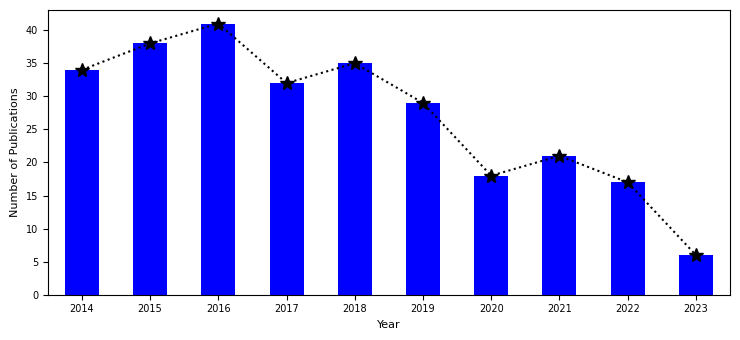

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

OBL_PSO = [6, 17, 21, 18, 29, 35, 32, 41, 38, 34]
PSO = [34, 38, 41, 32, 35, 29, 18, 21, 17, 6]
plt.rcParams["figure.figsize"] = [7.50, 3.50]
plt.rcParams["figure.autolayout"] = True

df = pd.DataFrame(dict(data=PSO),index=['2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022','2023'])
fig, ax = plt.subplots()

df['data'].plot(kind='bar', color='blue',fontsize=7)
df['data'].plot(kind='line', linestyle='dotted', marker='*', color='black', ms=10)
plt.xlabel("Year", fontsize=8)
plt.ylabel("Number of Publications", fontsize=8)
#plt.title('Year Wise Publications for Video Shot Boundary Detection Extracted from databases(ACM, IEEE, Jgate, Sciencedirect, Scopus)', fontsize=10)


plt.show()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 16, 112, 11  0           []                               
                                2, 3)]                                                            
                                                                                                  
 conv3d_149 (Conv3D)            (None, 8, 56, 56, 6  28288       ['input_2[0][0]']                
                                4)                                                                
                                                                                                  
 batch_normalization_197 (Batch  (None, 8, 56, 56, 6  256        ['conv3d_149[0][0]']             
 Normalization)                 4)                                                          

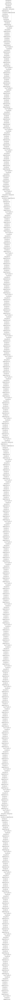

In [ ]:
#R3D50 structure as mentioned in : Content-Based Video Retrieval With Prototypes of Deep Features

from keras.layers import Conv3D, BatchNormalization, ReLU, Add, Input, MaxPooling3D, GlobalAvgPool3D, Dense, ZeroPadding3D, GlobalMaxPool3D
#Conv-Batchnorm_relu block
def conv_batchnorm_relu(x, filters, kernel_size, strides=1):

  x = Conv3D(filters=filters, kernel_size=kernel_size, strides=strides, padding = 'same')(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)

  return x

#Identity block

def identity_block(tensor, filters):
  x = conv_batchnorm_relu(tensor, filters=filters, kernel_size=1, strides=1)
  x = conv_batchnorm_relu(x, filters=filters, kernel_size=3, strides=1)
  x = conv_batchnorm_relu(x, filters=4*filters, kernel_size=1, strides=1)
  x = BatchNormalization()(x)
  x = Add()([tensor, x])  #Skip connention
  x = ReLU()(x)

  return x

def projection_block(tensor, filters, strides):
  
  #left stream
  x = conv_batchnorm_relu(tensor, filters=filters, kernel_size=1, strides=strides)
  x = conv_batchnorm_relu(x, filters=filters, kernel_size=3, strides=1)
  x = conv_batchnorm_relu(x, filters=4*filters, kernel_size=3, strides=1)
  x = BatchNormalization()(x)

  #right stream

  shortcut = Conv3D(filters=4*filters, kernel_size=1, strides=strides)(tensor)
  shortcut = BatchNormalization()(shortcut)

  x = Add()([shortcut, x])

  #skip connection
  x = ReLU()(x)

  return x

#Resnet block

def resnet_block(x, filters, reps, strides):

  x = projection_block(x, filters, strides)
  
  
  for i in range(0, (reps-1)):
    x = identity_block(x, filters)

  return x

#Model

from keras.models import Model

input = Input(shape=(16, 112, 112, 3))

#x = ZeroPadding2D(padding=3)(input)

x = conv_batchnorm_relu(input, filters=64, kernel_size=(3, 7, 7), strides=(2, 2, 2))
#x = ZeroPadding2D(padding=1)(x)
x = MaxPooling3D(pool_size = (1, 1, 1), strides = (1, 2, 2))(x)
#(3, 4, 6, 3)
#Block1
x = resnet_block(x, filters=64, reps=3*3, strides=(1, 1, 1))
#Block2
x = resnet_block(x, filters=128, reps=4*3, strides=(2, 2, 2))
#Block3
x = resnet_block(x, filters=256, reps=6*3, strides=(2, 2, 2))
#Block4
x = resnet_block(x, filters=512, reps=3*3, strides=(2, 2, 2))
#Average pooling
x = GlobalMaxPool3D()(x)

output = x
#Fully connected layer
#output = Dense(7, activation='softmax')(x)

model = Model(inputs=input, outputs=output)

model.summary()

# Visualize the model
import keras
keras.utils.plot_model(model, expand_nested=True, dpi=60, show_shapes=True)

In [ ]:
!pip install visualkeras
!pip install ann_visualizer
!pip install graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 992.0/992.0 KB 25.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for ann_visualizer: filename=ann_visualizer-2.5-py3-none-any.whl size=4179 sha256=b7abfc79a4b55a936d1cff0fbd82d7db1d66db5b60e6405094b1d9a098a409b7
  Stored in directory: /root/.cache/pip/wheels/2d/d8/86/67f4a249969eaaa31c6df569f4ebfa84634fae3af2c627107b
Successfully built ann_visualizer
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#model1 = construct_model()\
import visualkeras
#
visualkeras.layered_view(model, legend=True) # without custom font
from PIL import ImageFont
font = ImageFont.truetype("arial.ttf", 12)
#visualkeras.layered_view(model, legend=True, font=font)
model1 = model

from PIL import ImageFont

visualkeras.layered_view(model, legend=True, font=font, draw_volume=False,spacing=30)

OSError: ignored

In [ ]:
visualkeras.layered_view(model1, legend=True) # without custom font
visualkeras.layered_view(model, legend=True, draw_volume=False)

In [ ]:
import os
import cv2
import math
#import pafy
import random
import numpy as np
import datetime as dt
import tensorflow as tf
#from moviepy.editor import *
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model


model = Sequential()
model.add(ConvLSTM2D(filters = 64, kernel_size = (3, 3), return_sequences = False, data_format = "channels_last", input_shape = (2, 224, 224, 3)))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(256, activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(7, activation = "softmax"))

model.summary()
 
#opt = keras.optimizers.SGD(learning_rate=0.001)
#model.compile(loss='categorical_crossentropy', optimizer= opt, metrics=["accuracy"])




Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 222, 222, 64)      154624    
                                                                 
 dropout (Dropout)           (None, 222, 222, 64)      0         
                                                                 
 flatten (Flatten)           (None, 3154176)           0         
                                                                 
 dense (Dense)               (None, 256)               807469312 
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 7)                 1799      
                                                                 
Total params: 807,625,735
Trainable params: 807,625,735


In [ ]:
#MULTIPROTOTYPE LOGISTIC REGRESSION UCF101
#filename is the category in prototype creating classwise groups of videos and storage
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



#Xtrain1 = []
#ytrain1 = []
file = open('/content/UCF101_R3D50layer4_ORIG.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0


cl = []
cate = []

cl_whole = []
cate_whole = []
prev = None
for item in data:
  
  #For the first category  
  #cnt = cnt + 1
  next = item['category']

  if prev == None:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    print(cnt)
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else :
  if prev == next:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else:
  if prev != next:
    cnt = 0
    cl_whole.append(cl)
    cate_whole.append(cate)
    cl = []
    cate = []
    
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
print(cnt)
cl_whole.append(cl)
cate_whole.append(cate)

#clustered sampling for creating more prototypes with minimum number of samples

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



samp_cl = []
samp_cate = []

#Code to find minimum number of samples
m_c = []
for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  m_c.append(cl_whole[i].shape[0])

th = 1
N = min(m_c)
print(N)

for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  #if cl_whole[i].shape[0] != N :
  kmeans = KMeans(n_clusters=(N-th))
  kmeans.fit(cl_whole[i])
  y_kmeans = kmeans.predict(cl_whole[i])
  centers = kmeans.cluster_centers_
  for t in range(len(centers)):
    samp_cl.append(centers[t])
  for j in range(N-th):
    cat.append(cate_whole[i][0])
  
  
  samp_cate.append(cat)


  #print(centers.shape)
print(len(samp_cl))
print(len(samp_cate))

Xtrain1 = np.array(samp_cl)
Xtrain1.shape

samp_cate = list(np.concatenate(samp_cate).flat)

ytrain1 = np.array(samp_cate).ravel()
ytrain1
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
#encoded = to_categorical(data)
data_train


Xtest1 = []
ytest1 = []
file = open('/content/UCF101_R3D50layer4_ORIG_query.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])

ytest1 = np.array(ytest1)
Xtest1 = np.array(Xtest1)
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_test = label_encoder.fit_transform(ytest1)
# one hot encode
#encoded = to_categorical(data)
data_test


In [ ]:
np.save('Xtrain_Layer4_UCF101.npy', Xtrain1)
np.save('data_train_layer4_UCF101.npy', data_train)

In [ ]:
#MULTIPROTOTYPE LOGISTIC REGRESSION HMDB51
#filename is the category in prototype creating classwise groups of videos and storage
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



#Xtrain1 = []
#ytrain1 = []
file = open('/content/HMDB51_R3D50_ORIG_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0


cl = []
cate = []

cl_whole = []
cate_whole = []
prev = None
for item in data:
  
  #For the first category  
  #cnt = cnt + 1
  next = item['category']

  if prev == None:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    print(cnt)
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else :
  if prev == next:
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
  #else:
  if prev != next:
    cnt = 0
    cl_whole.append(cl)
    cate_whole.append(cate)
    cl = []
    cate = []
    
    cnt = cnt + 1
  #print('The data ', cnt, ' is : ', item['path'])
  #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])
    prev = item['category']
    cl.append(np.array(item['features']).ravel())
    cate.append((item['category']))
print(cnt)
cl_whole.append(cl)
cate_whole.append(cate)

#clustered sampling for creating more prototypes with minimum number of samples

import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



samp_cl = []
samp_cate = []

#Code to find minimum number of samples
m_c = []
for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  m_c.append(cl_whole[i].shape[0])

th = 1
N = min(m_c)
print(N)

for i in range(len(cl_whole)):
  cat = []
  cl_whole[i] = np.array(cl_whole[i])
  print(cl_whole[i].shape)
  #if cl_whole[i].shape[0] != N :
  kmeans = KMeans(n_clusters=(N-th))
  kmeans.fit(cl_whole[i])
  y_kmeans = kmeans.predict(cl_whole[i])
  centers = kmeans.cluster_centers_
  for t in range(len(centers)):
    samp_cl.append(centers[t])
  for j in range(N-th):
    cat.append(cate_whole[i][0])
  
  
  samp_cate.append(cat)


  #print(centers.shape)
print(len(samp_cl))
print(len(samp_cate))

Xtrain1 = np.array(samp_cl)
Xtrain1.shape

samp_cate = list(np.concatenate(samp_cate).flat)

ytrain1 = np.array(samp_cate).ravel()
ytrain1
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
#encoded = to_categorical(data)
data_train


Xtest1 = []
ytest1 = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])

ytest1 = np.array(ytest1)
Xtest1 = np.array(Xtest1)
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_test = label_encoder.fit_transform(ytest1)
# one hot encode
#encoded = to_categorical(data)
data_test


Showing the pickled data:
smoke
1
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
smoke
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
kick
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_gun
shoot_

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(70, 32768)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


3519
51
Showing the pickled data:
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768

array([40, 40, 40, ..., 42, 42, 42])

In [ ]:
np.save('Xtrain_Layer4_HMDB51.npy', Xtrain1)
np.save('data_train_layer4_HMDB51.npy', data_train)

In [ ]:
import numpy as np

#Create NumPy arrays
arr = np.array([4, 7, 12, 1])
arr1 = np.array([5, 9, 15])

# Use concatenate() to join two arrays
con = np.concatenate((arr, arr1))
print(con)

[ 4  7 12  1  5  9 15]


In [ ]:
#filename is the category in prototype #TRAINING DATASET
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math
import os
from keras.models import Model
from keras.optimizers import Adam
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.applications.xception import Xception, preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D, GlobalMaxPooling2D
from pathlib import Path
import numpy as np




Xtrain1 = []
ytrain1 = []
file = open('/content/UCF101_R3D50layer4_ORIG.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    #point_a2 = GlobalMaxPooling2D()(np.array(item['features']).reshape(2048, 1, 4, 4))
    #point_a2 = (np.array(item['features']).ravel())
    point_a2 = GlobalAveragePooling2D()(np.array(item['features']).reshape(2048, 1, 4, 4))

    #point_a1 = GlobalAveragePooling3D()(np.array(item['features']).reshape(2048, 1, 4, 4, 1))
    print(point_a2.shape)
    point_a = point_a2
    #point_a2 = np.array(point_a2).ravel()
    #point_a1 = np.array(point_a1).ravel()
    #point_a = np.concatenate((point_a2, point_a1))
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtrain1.append(point_a)
    ytrain1.append(item['category'])
    
Xtrain1 = np.array(Xtrain1)

ytrain1 = np.array(ytrain1)
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
#encoded = to_categorical(data)
data_train

Streaming output truncated to the last 5000 lines.
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)
GolfSwing
(2048, 4)
(2048, 4)

array([15, 15, 15, ..., 87, 87, 87])

In [ ]:
#filename is the category in prototype #TRAINING DATASET
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math
import os
from keras.models import Model
from keras.optimizers import Adam
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.applications.xception import Xception, preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D, GlobalMaxPooling2D
from pathlib import Path
import numpy as np




Xtrain1 = []
ytrain1 = []
file = open('/content/UCF101_R3D50layer4_ORIG.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    #point_a2 = GlobalMaxPooling2D()(np.array(item['features']).reshape(2048, 1, 4, 4))
    #point_a2 = (np.array(item['features']).ravel())
    #point_a2 = GlobalAveragePooling2D()(np.array(item['features']).reshape(2048, 1, 4, 4))
    point_a2 = (np.array(item['features']))
    point_a = []
    for i in range(len(point_a2)):
      x = np.max(np.array(point_a2[i]).ravel())
      point_a.append(x)
    #point_a1 = GlobalAveragePooling3D()(np.array(item['features']).reshape(2048, 1, 4, 4, 1))
    print(point_a2.shape)
    point_a = np.array(point_a)
    #point_a2 = np.array(point_a2).ravel()
    #point_a1 = np.array(point_a1).ravel()
    #point_a = np.concatenate((point_a2, point_a1))
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtrain1.append(point_a)
    ytrain1.append(item['category'])
    
Xtrain1 = np.array(Xtrain1)

ytrain1 = np.array(ytrain1)
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
#encoded = to_categorical(data)
data_train

Streaming output truncated to the last 5000 lines.
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwing
(2048, 1, 4, 4)
(2048,)
GolfSwi

array([15, 15, 15, ..., 87, 87, 87])

In [ ]:
#filename is the category in prototype #TRAINING DATASET
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math
import os
from keras.models import Model
from keras.optimizers import Adam
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.applications.xception import Xception, preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D, GlobalMaxPooling2D
from pathlib import Path
import numpy as np




Xtrain1 = []
ytrain1 = []
file = open('/content/HMDB51_R3D50_ORIG_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    #point_a2 = GlobalMaxPooling2D()(np.array(item['features']).reshape(2048, 1, 4, 4))
    #point_a2 = (np.array(item['features']).ravel())
    #point_a2 = GlobalAveragePooling2D()(np.array(item['features']).reshape(2048, 1, 4, 4))
    point_a2 = (np.array(item['features'])).reshape(2048, 1, 4, 4)
    point_a = []
    for i in range(len(point_a2)):
      x = np.max(np.array(point_a2[i]).ravel())
      point_a.append(x)
    #point_a1 = GlobalAveragePooling3D()(np.array(item['features']).reshape(2048, 1, 4, 4, 1))
    print(point_a2.shape)
    point_a = np.array(point_a)
    #point_a2 = np.array(point_a2).ravel()
    #point_a1 = np.array(point_a1).ravel()
    #point_a = np.concatenate((point_a2, point_a1))
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtrain1.append(point_a)
    ytrain1.append(item['category'])
    
Xtrain1 = np.array(Xtrain1)

ytrain1 = np.array(ytrain1)
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
#encoded = to_categorical(data)
data_train

Streaming output truncated to the last 5000 lines.
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048,)
fencing
(2048, 1, 4, 4)
(2048

array([40, 40, 40, ..., 42, 42, 42])

In [ ]:
Xtest1 = []
ytest1 = []
file = open('/content/UCF101_R3D50layer4_ORIG_query.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    #point_a2 = GlobalMaxPooling2D()(np.array(item['features']).reshape(2048, 1, 4, 4))
    #point_a2 = GlobalAveragePooling3D()(np.array(item['features']).reshape(1, 2048, 1, 4, 4))
    #point_a1 = GlobalAveragePooling3D()(np.array(item['features']).reshape(2048, 1, 4, 4, 1))
    #print(point_a1.shape)
    #point_a2 = np.array(point_a2).ravel()
    #point_a1 = np.array(point_a1).ravel()
    #point_a = np.concatenate((point_a2, point_a1))
    point_a2 = (np.array(item['features']))
    point_a = []
    for i in range(len(point_a2)):
      x = np.max(np.array(point_a2[i]).ravel())
      point_a.append(x)
    #point_a1 = GlobalAveragePooling3D()(np.array(item['features']).reshape(2048, 1, 4, 4, 1))
    print(point_a2.shape)
    point_a = np.array(point_a)
    
        
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])

ytest1 = np.array(ytest1)
Xtest1 = np.array(Xtest1)
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_test = label_encoder.fit_transform(ytest1)
# one hot encode
#encoded = to_categorical(data)
data_test


Streaming output truncated to the last 5000 lines.
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
Lunges
(2048, 1, 4, 4)
(2048,)
FloorGymnastics
(2048, 1, 4, 4)
(2048,)
FloorGymnastics
(2048, 1, 4, 4)
(2048,)
FloorGymnastics
(2048, 1, 4, 4)
(2048,)
FloorGymnastics
(2048, 1, 4, 4

array([15, 15, 15, ..., 87, 87, 87])

In [ ]:
Xtest1 = []
ytest1 = []
file = open('/content/HMDB51_R3D50_ORIG_QUERY_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    #point_a2 = GlobalMaxPooling2D()(np.array(item['features']).reshape(2048, 1, 4, 4))
    #point_a2 = GlobalAveragePooling3D()(np.array(item['features']).reshape(1, 2048, 1, 4, 4))
    #point_a1 = GlobalAveragePooling3D()(np.array(item['features']).reshape(2048, 1, 4, 4, 1))
    #print(point_a1.shape)
    #point_a2 = np.array(point_a2).ravel()
    #point_a1 = np.array(point_a1).ravel()
    #point_a = np.concatenate((point_a2, point_a1))
    point_a2 = (np.array(item['features'])).reshape(2048, 1, 4, 4)
    point_a = []
    for i in range(len(point_a2)):
      x = np.max(np.array(point_a2[i]).ravel())
      point_a.append(x)
    #point_a1 = GlobalAveragePooling3D()(np.array(item['features']).reshape(2048, 1, 4, 4, 1))
    print(point_a2.shape)
    point_a = np.array(point_a)
    
        
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])

ytest1 = np.array(ytest1)
Xtest1 = np.array(Xtest1)
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_test = label_encoder.fit_transform(ytest1)
# one hot encode
#encoded = to_categorical(data)
data_test


Showing the pickled data:
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
smoke
(2048, 1, 4, 4)
(2048,)
kick
(2048, 1, 4, 4)
(2048,)
kick
(2048, 1, 4, 4)
(2048,)
kick
(2048, 1, 4

array([40, 40, 40, ..., 42, 42, 42])

In [ ]:
#one vs all SVM for muti class classification
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score,classification_report
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split
#df = pd.read_csv('winequality-white.csv',  delimiter=';')
#y = df["quality"]
my_classes = np.unique(data_train)
#X = df.drop("quality", axis=1)

#X_train, X_test, Y_train, Y_test = train_test_split(X,y, random_state=42)

# Models
clfs =  []

for k in my_classes:
    my_model = SVC(gamma='auto', C=1000, kernel='linear', class_weight='balanced'
                   , probability=True, random_state=42, max_iter=-1)
        #my_model = LinearSVC(penalty='l2', loss='squared_hinge', dual=True, tol=0.0001, C=1.0, fit_intercept=True, intercept_scaling=1, class_weight='balanced', verbose=0, random_state=None, max_iter=250)
    #clfs.append(my_model.fit(Xtrain1, data_train==k))
    clfs.append(my_model.fit(Xtrain1, [1 if element == k else -1 for element in data_train]))
    

In [ ]:
#LOGISTIC REGRESSION TRAINING UCF101
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

#solution = np.load('/content/sol_HMDB51.npy')

log12 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=5, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

#log1 = RandomForestClassifier(n_estimators=100)
log1 = SVC()
#log1 = GaussianNB()
log1.fit(Xtrain1, data_train)

ypred = log1.predict(Xtest1)
print(accuracy_score(data_test, ypred))
#log1.fit(Xtrain1[:,solution==1], data_train)


0.8540840602696272


In [ ]:
#LOGISTIC REGRESSION TRAINING UCF101
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

#solution = np.load('/content/sol_HMDB51.npy')

log12 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=5, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

#log1 = RandomForestClassifier(n_estimators=100)
log1 = SVC()
#log1 = GaussianNB()
log1.fit(Xtrain1, data_train)

ypred = log1.predict(Xtest1)
print(accuracy_score(data_test, ypred))
#log1.fit(Xtrain1[:,solution==1], data_train)


0.596078431372549


In [ ]:
#LOGISTIC REGRESSION TRAINING UCF101
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

#solution = np.load('/content/sol_HMDB51.npy')

log1 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=25, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

#log1 = RandomForestClassifier(n_estimators=100)
#log1 = SVC()
#log1 = GaussianNB()
log1.fit(Xtrain1, data_train)

ypred = log1.predict(Xtest1)
print(accuracy_score(data_test, ypred))
#log1.fit(Xtrain1[:,solution==1], data_train)


0.00196078431372549


/usr/local/lib/python3.9/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(


In [ ]:
#LOGISTIC REGRESSION TRAINING UCF101
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

#solution = np.load('/content/sol_HMDB51.npy')

log12 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=5, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

#log1 = RandomForestClassifier(n_estimators=100)
log1 = SVC()
#log1 = GaussianNB()
log1.fit(Xtrain1, data_train)

ypred = log1.predict(Xtest1)
print(accuracy_score(data_test, ypred))
#log1.fit(Xtrain1[:,solution==1], data_train)


0.5797385620915033


In [ ]:
import numpy as np
Xtrain1 = np.load('/content/Xtrain_Layer4_HMDB51.npy')
data_train = np.load('/content/data_train_layer4_HMDB51.npy')

In [ ]:
import pickle
Xtest1 = []
ytest1 = []

file = open('/content/HMDB51_R3D50_ORIG_QUERY_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])

ytest1 = np.array(ytest1)
Xtest1 = np.array(Xtest1)
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_test = label_encoder.fit_transform(ytest1)
# one hot encode
#encoded = to_categorical(data)
data_test


Showing the pickled data:
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
smoke
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32768,)
kick
(32768, 1)
(32

array([40, 40, 40, ..., 42, 42, 42])

In [ ]:
Xtrain1 = Xtrain_selected_features
Xtest1 = Xtest_selected_features

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn import datasets


import numpy as np

from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils import check_random_state
from sklearn.preprocessing import LabelEncoder


from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score



C = 1
max_iter = 17
tol=0.01
random_state=1
verbose=0

#C=1, tol=0.01, max_iter=100, random_state=0, verbose=1

def projection_simplex(v, z=1):
    """
    Projection onto the simplex:
        w^* = argmin_w 0.5 ||w-v||^2 s.t. \sum_i w_i = z, w_i >= 0
    """
    # For other algorithms computing the same projection, see
    # https://gist.github.com/mblondel/6f3b7aaad90606b98f71
    n_features = v.shape[0]
    u = np.sort(v)[::-1]
    cssv = np.cumsum(u) - z
    ind = np.arange(n_features) + 1
    cond = u - cssv / ind > 0
    rho = ind[cond][-1]
    theta = cssv[cond][-1] / float(rho)
    w = np.maximum(v - theta, 0)
    return w


def _partial_gradient(X, y, i):
        # Partial gradient for the ith sample.
        g = np.dot(X[i], coef_.T) + 1
        g[y[i]] -= 1
        return g

def _violation(g, y, i):
    # Optimality violation for the ith sample.
    smallest = np.inf
    for k in range(g.shape[0]):
        if k == y[i] and dual_coef_[k, i] >= C:
            continue
        elif k != y[i] and dual_coef_[k, i] >= 0:
            continue

        smallest = min(smallest, g[k])

    return g.max() - smallest

def _solve_subproblem(g, y, norms, i):
    # Prepare inputs to the projection.
    Ci = np.zeros(g.shape[0])
    Ci[y[i]] = C
    beta_hat = norms[i] * (Ci - dual_coef_[:, i]) + g / norms[i]
    z = C * norms[i]

    # Compute projection onto the simplex.
    beta = projection_simplex(beta_hat, z)
    #beta = beta_hat

    return Ci - dual_coef_[:, i] - beta / norms[i]

n_samples, n_features = Xtrain1.shape

# Normalize labels.
_label_encoder = LabelEncoder()
y = data_train#_label_encoder.fit_transform(ytrain1)
X = Xtrain1
# Initialize primal and dual coefficients.
n_classes = 101#len(_label_encoder.classes_)
dual_coef_ = np.zeros((n_classes, n_samples), dtype=np.float64)
coef_ = np.zeros((n_classes, n_features))
#coef_ = W.T
B = np.zeros(n_classes)

# Pre-compute norms.
norms = np.sqrt(np.sum(Xtrain1 ** 2, axis=1))

# Shuffle sample indices.
rs = check_random_state(random_state)
ind = np.arange(n_samples)
rs.shuffle(ind)

violation_init = None
for it in range(max_iter):
    #print('iteration '+ str(it))
    violation_sum = 0

    for ii in range(n_samples):
        i = ind[ii]

        # All-zero samples can be safely ignored.
        if norms[i] == 0:
            continue

        g = _partial_gradient(X, y, i)
        v = _violation(g, y, i)
        violation_sum += v

        if v < 1e-12:
            continue

        # Solve subproblem for the ith sample.
        delta = _solve_subproblem(g, y, norms, i)
        #print('delta')
        #print(delta.shape)

        # Update primal and dual coefficients.
        coef_ += (delta * X[i][:, np.newaxis]).T
        #print('coeff')
        #print(coef_.shape)
        dual_coef_[:, i] += delta
        #print('dual_coeff')
        #print(dual_coef_.shape)

    if it == 0:
        violation_init = violation_sum

    vratio = violation_sum / violation_init

    if verbose >= 1:
        print("iter", it + 1, "violation", vratio)

    if vratio < tol:
        if verbose >= 1:
            print("Converged")
        break
    
    decision = np.dot(Xtrain1, coef_.T) + delta
    pred = decision.argmax(axis=1)

    print(accuracy_score(pred,data_train))

    decision = np.dot(Xtest1, coef_.T) + delta
    pred = decision.argmax(axis=1)

    print(accuracy_score(pred,data_test))


0.9278599140190835
0.7906423473433782
0.9684387123833491
0.8120539254559873
0.9831183810422565
0.8160190325138779
0.9908776344762504
0.8228918847475548
0.9938135682080319
0.8268569918054454
0.9954912446261928
0.8295003965107058
0.9973786305966237
0.8329368226275443
0.9986368879102443
0.8324081416864922
0.9989514522386495
0.8342585249801745
0.9993708713431897
0.8321438012159662
0.9994757261193248
0.8345228654507005
0.9996854356715948
0.8355802273328047
0.9997902904477299
0.8384879725085911
0.9997902904477299
0.8369019296854349
0.9998951452238649
0.8413957176843775
1.0
0.8411313772138514
1.0
0.8406026962727994


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn import datasets


import numpy as np

from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils import check_random_state
from sklearn.preprocessing import LabelEncoder


from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score



C = 1
max_iter = 50
tol=0.01
random_state=1
verbose=0

#C=1, tol=0.01, max_iter=100, random_state=0, verbose=1

def projection_simplex(v, z=1):
    """
    Projection onto the simplex:
        w^* = argmin_w 0.5 ||w-v||^2 s.t. \sum_i w_i = z, w_i >= 0
    """
    # For other algorithms computing the same projection, see
    # https://gist.github.com/mblondel/6f3b7aaad90606b98f71
    n_features = v.shape[0]
    u = np.sort(v)[::-1]
    cssv = np.cumsum(u) - z
    ind = np.arange(n_features) + 1
    cond = u - cssv / ind > 0
    rho = ind[cond][-1]
    theta = cssv[cond][-1] / float(rho)
    w = np.maximum(v - theta, 0)
    return w


def _partial_gradient(X, y, i):
        # Partial gradient for the ith sample.
        g = np.dot(X[i], coef_.T) + 1
        g[y[i]] -= 1
        return g

def _violation(g, y, i):
    # Optimality violation for the ith sample.
    smallest = np.inf
    for k in range(g.shape[0]):
        if k == y[i] and dual_coef_[k, i] >= C:
            continue
        elif k != y[i] and dual_coef_[k, i] >= 0:
            continue

        smallest = min(smallest, g[k])

    return g.max() - smallest

def _solve_subproblem(g, y, norms, i):
    # Prepare inputs to the projection.
    Ci = np.zeros(g.shape[0])
    Ci[y[i]] = C
    beta_hat = norms[i] * (Ci - dual_coef_[:, i]) + g / norms[i]
    z = C * norms[i]

    # Compute projection onto the simplex.
    beta = projection_simplex(beta_hat, z)
    #beta = beta_hat

    return Ci - dual_coef_[:, i] - beta / norms[i]

n_samples, n_features = Xtrain1.shape

# Normalize labels.
_label_encoder = LabelEncoder()
y = data_train#_label_encoder.fit_transform(ytrain1)
X = Xtrain1
# Initialize primal and dual coefficients.
n_classes = 51#len(_label_encoder.classes_)
dual_coef_ = np.zeros((n_classes, n_samples), dtype=np.float64)
coef_ = np.zeros((n_classes, n_features))
#coef_ = W.T
B = np.zeros(n_classes)

# Pre-compute norms.
norms = np.sqrt(np.sum(Xtrain1 ** 2, axis=1))

# Shuffle sample indices.
rs = check_random_state(random_state)
ind = np.arange(n_samples)
rs.shuffle(ind)

violation_init = None
for it in range(max_iter):
    #print('iteration '+ str(it))
    violation_sum = 0

    for ii in range(n_samples):
        i = ind[ii]

        # All-zero samples can be safely ignored.
        if norms[i] == 0:
            continue

        g = _partial_gradient(X, y, i)
        v = _violation(g, y, i)
        violation_sum += v

        if v < 1e-12:
            continue

        # Solve subproblem for the ith sample.
        delta = _solve_subproblem(g, y, norms, i)
        #print('delta')
        #print(delta.shape)

        # Update primal and dual coefficients.
        coef_ += (delta * X[i][:, np.newaxis]).T
        #print('coeff')
        #print(coef_.shape)
        dual_coef_[:, i] += delta
        #print('dual_coeff')
        #print(dual_coef_.shape)

    if it == 0:
        violation_init = violation_sum

    vratio = violation_sum / violation_init

    if verbose >= 1:
        print("iter", it + 1, "violation", vratio)

    if vratio < tol:
        if verbose >= 1:
            print("Converged")
        break
    
    decision = np.dot(Xtrain1, coef_.T) + delta
    pred = decision.argmax(axis=1)

    print(accuracy_score(pred,data_train))

    decision = np.dot(Xtest1, coef_.T) + delta
    pred = decision.argmax(axis=1)

    print(accuracy_score(pred,data_test))


0.6775910364145659
0.47516339869281043
0.7717086834733894
0.49607843137254903
0.838655462184874
0.4915032679738562
0.869187675070028
0.4869281045751634
0.8966386554621849
0.4915032679738562
0.9170868347338935
0.4928104575163399
0.930812324929972
0.49869281045751634
0.9425770308123249
0.5052287581699346
0.9478991596638655
0.5137254901960784
0.9557422969187676
0.5176470588235295
0.9619047619047619
0.5189542483660131
0.9705882352941176
0.5235294117647059
0.9761904761904762
0.5235294117647059
0.9803921568627451
0.5274509803921569
0.9817927170868347
0.5294117647058824
0.9837535014005602
0.5287581699346405
0.9845938375350141
0.530718954248366
0.9859943977591037
0.5339869281045752
0.988795518207283
0.530718954248366
0.9896358543417367
0.5333333333333333
0.9901960784313726
0.5379084967320261
0.9910364145658264
0.5359477124183006
0.9929971988795518
0.5372549019607843
0.9935574229691877
0.5418300653594771
0.9941176470588236
0.5431372549019607
0.996078431372549
0.5424836601307189
0.99663865546218

In [ ]:
np.save('best_layer40_UCF101.npy',solution.best_agent)

In [ ]:
#Logistic regression training

from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = data_train#label_encoder.fit_transform(ytrain1)
# one hot encode
y_enc = to_categorical(data_train)



def net_input(X, W, b):
    return(np.dot(X, W) + b)
    #return (X.dot(W) + b)

#def net_input(X, W):
#    return (X @ (W))



def softmax(z):
    return (np.float128(np.exp(z.T)) / np.sum(np.float128(np.exp(z)), axis=1)).T 

def to_classlabel(z):
    return z.argmax(axis=1)

def cross_entropy(output, y_target):
    return - np.sum(np.log(output) * (y_target), axis=1)


import numpy as np

eta = 0.01
l2 = 0.001

#W = np.random.normal(loc=0.0, scale=0.01, size=(Xtrain1.shape[1], 51))
#W = np.zeros((Xtrain1.shape[1], 101))
W =  coef_.T
#W = W
#W = np.load('/content/W1500_UCF101.npy')
#B = np.random.normal(loc=0.0, scale=0.01, size=(51))
B = delta#np.zeros(51)
#B = B
#B = np.load('/content/B1500_UCF101.npy')
print("weights")
print(W)
print("bias")
print(B)
global W, B
N = Xtrain1.shape[0]
for i in range(30):
  print(str(i) +"th epoch")
  net = net_input(Xtrain1, W, B)
  softm = softmax(net)
  diff = (softm - y_enc)
  for i in range(diff.shape[0]):
    for j in range(diff.shape[1]):
      if np.isnan(diff[i][j]) == True:
        diff[i][j] = 0.000001

  print("differential")
  print(diff)
  mse = np.mean(diff, axis=0)
  #print("mse")
  #print(mse)
    # gradient -> n_features x n_classes
  #grad = 1/N * (np.dot(Xtrain1.T, diff))
  grad = 1/N * (Xtrain1.T @ diff)
  for i in range(grad.shape[0]):
    for j in range(grad.shape[1]):
      if np.isnan(grad[i][j]) == True:
        grad[i][j] = 0.0000001
  print("gradient")
  print(grad)
    # update in opp. direction of the cost gradient
  W -= (eta * grad + 2 * eta * l2 * W)
  B -= (eta * np.sum(diff, axis=0))
  for i in range(W.shape[0]):
    for j in range(W.shape[1]):
      if np.isnan(W[i][j]) == True:
        W[i][j] = 0
  for i in range(B.shape[0]):
    if np.isnan(B[i]) == True:
        B[i] = 0.00000001
  print("weights")
  print(W)
  print("bias")
  print(B)


    # compute cost of the whole epoch
  net = net_input(Xtrain1, W, B)
  softm = softmax(net)
  cross_ent = cross_entropy(output=softm, y_target=y_enc)
  net_f = net_input(Xtrain1, W, B)
  softm = softmax(net_f)
  smax = to_classlabel(softm)
  print("accuracy score is " + str(accuracy_score(data_train, smax)))
  #to_classlabel(softmax(net_input(Xtest1, W, B)))
  net_f = net_input(Xtest1, W, B)
  softm = softmax(net_f)
  smax = to_classlabel(softm)
  print("test accuracy score is " + str(accuracy_score(data_test, smax)))


weights
[[-0.00047061  0.00165418  0.00939779 ...  0.00105502 -0.00088228
  -0.0035028 ]
 [ 0.00010102 -0.00140998  0.00186255 ...  0.00033316 -0.00158073
  -0.00168013]
 [-0.00344407  0.00286944 -0.00329593 ... -0.00071081 -0.00067447
   0.00299664]
 ...
 [ 0.00277745  0.00267562 -0.0010419  ... -0.00011366  0.00016234
  -0.00064912]
 [-0.00207705  0.00332616  0.00148721 ... -0.00140808 -0.0029119
  -0.0002339 ]
 [-0.00116502 -0.00033591 -0.00042799 ... -0.0005118   0.00145191
   0.00308749]]
bias
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.31345210e-05  0.00000000e+00  0.00000

In [ ]:
#Logistic regression training

from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = data_train#label_encoder.fit_transform(ytrain1)
# one hot encode
y_enc = to_categorical(data_train)



def net_input(X, W, b):
    return(np.dot(X, W) + b)
    #return (X.dot(W) + b)

#def net_input(X, W):
#    return (X @ (W))



def softmax(z):
    return (np.float128(np.exp(z.T)) / np.sum(np.float128(np.exp(z)), axis=1)).T 

def to_classlabel(z):
    return z.argmax(axis=1)

def cross_entropy(output, y_target):
    return - np.sum(np.log(output) * (y_target), axis=1)


import numpy as np

eta = 0.01
l2 = 0.001

#W = np.random.normal(loc=0.0, scale=0.01, size=(Xtrain1.shape[1], 51))
#W = np.zeros((Xtrain1.shape[1], 101))
W =  coef_.T
#W = W
#W = np.load('/content/W1500_UCF101.npy')
#B = np.random.normal(loc=0.0, scale=0.01, size=(51))
B = delta#np.zeros(51)
#B = B
#B = np.load('/content/B1500_UCF101.npy')
print("weights")
print(W)
print("bias")
print(B)
global W, B
N = Xtrain1.shape[0]
for i in range(100):
  print(str(i) +"th epoch")
  net = net_input(Xtrain1, W, B)
  softm = softmax(net)
  diff = (softm - y_enc)
  for i in range(diff.shape[0]):
    for j in range(diff.shape[1]):
      if np.isnan(diff[i][j]) == True:
        diff[i][j] = 0.000001

  print("differential")
  print(diff)
  mse = np.mean(diff, axis=0)
  #print("mse")
  #print(mse)
    # gradient -> n_features x n_classes
  #grad = 1/N * (np.dot(Xtrain1.T, diff))
  grad = 1/N * (Xtrain1.T @ diff)
  for i in range(grad.shape[0]):
    for j in range(grad.shape[1]):
      if np.isnan(grad[i][j]) == True:
        grad[i][j] = 0.0000001
  print("gradient")
  print(grad)
    # update in opp. direction of the cost gradient
  W -= (eta * grad + 2 * eta * l2 * W)
  B -= (eta * np.sum(diff, axis=0))
  for i in range(W.shape[0]):
    for j in range(W.shape[1]):
      if np.isnan(W[i][j]) == True:
        W[i][j] = 0
  for i in range(B.shape[0]):
    if np.isnan(B[i]) == True:
        B[i] = 0.00000001
  print("weights")
  print(W)
  print("bias")
  print(B)


    # compute cost of the whole epoch
  net = net_input(Xtrain1, W, B)
  softm = softmax(net)
  cross_ent = cross_entropy(output=softm, y_target=y_enc)
  net_f = net_input(Xtrain1, W, B)
  softm = softmax(net_f)
  smax = to_classlabel(softm)
  print("accuracy score is " + str(accuracy_score(data_train, smax)))
  #to_classlabel(softmax(net_input(Xtest1, W, B)))
  net_f = net_input(Xtest1, W, B)
  softm = softmax(net_f)
  smax = to_classlabel(softm)
  print("test accuracy score is " + str(accuracy_score(data_test, smax)))


weights
[[-7.59612693e-03  4.76840764e-03  3.63665798e-04 ... -6.25743811e-03
  -6.43778682e-03  6.82280300e-04]
 [ 9.05423883e-04 -1.92093869e-03  3.35647057e-03 ... -6.66893220e-03
   4.73623198e-03  7.65644904e-03]
 [ 2.71992554e-03 -6.31666491e-03 -3.89484243e-03 ...  7.77167351e-03
  -6.14820655e-03  2.82668697e-03]
 ...
 [ 3.09683963e-03  1.81604097e-03 -2.92178590e-03 ... -3.36494767e-03
   9.86183579e-03 -7.00518573e-03]
 [ 7.94438587e-03  3.64723460e-03 -7.84144796e-03 ... -2.02487465e-02
  -1.72896474e-02 -5.50570694e-03]
 [-6.97244893e-05 -1.20435749e-02 -5.53051367e-03 ... -4.21768738e-03
  -8.48229713e-03  4.58564572e-04]]
bias
[-0.23223482 -0.06590059 -0.44313804  0.13906954 -0.00694844  0.04570118
 -0.39102941  0.7572378  -0.08887772 -0.220746    0.24240641  0.42019589
  0.5851868  -0.26066825 -0.05475193 -0.78348464 -0.20986664  0.03809851
  0.04373649  0.10826235  0.01264292  0.48773621  0.79700677 -0.32601358
 -0.04979459 -0.96551426 -0.58786382  0.51913529 -0.1712752

In [ ]:
np.save()

In [ ]:
np.save('W_SVM_UCF101_20.npy', coef_)
np.save('delta_SVM_UCF101_20.npy',delta)

In [ ]:
#UCF101 Layer4 feature Euclidean Distance
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/UCF101_R3D50layer4_ORIG_query.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] + '.npy'
    print(category)
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    a = point_a[:,solution.best_agent==1]
    #a = point_a
    decision = np.dot(a, coef_.T) + delta
    a = decision.argmax(axis=1)
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/UCF101_R3D50layer4_ORIG_proto_rev.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['feature']).reshape(2048,1,4,4)
        point_b = point_b.ravel().reshape(1, -1)
        b = point_b[:,solution.best_agent==1]
        #b = point_b
        decision = np.dot(b, coef_.T) + delta
        b = decision.argmax(axis=1)
    
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        distance = np.linalg.norm(a - b)
        #distance = cosine_similarity(a, b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
[{'similarity': 17.0, 'category': 'BoxingSpeedBag.npy'}, {'similarity': 49.0, 'category': 'Knitting.npy'}, {'similarity': 97.0, 'category': 'WalkingWithDog.npy'}, {'similarity': 98.0, 'category': 'WallPushups.npy'}, {'similarity': 15.0, 'category': 'Bowling.npy'}, {'similarity': 33.0, 'category': 'Haircut.npy'}, {'similarity': 35.0, 'category': 'Hammering.npy'}, {'similarity': 9.0, 'category': 'BenchPress.npy'}, {'similarity': 39.0, 'category': 'HighJump.npy'}, {'similarity': 55.0, 'category': 'Nunchucks.npy'}, {'similarity': 46.0, 'category': 'JumpRope.npy'}, {'similarity': 90.0, 'category': 'TaiChi.npy'}, {'similarity': 20.0, 'category': 'CleanAndJerk.npy'}, {'similarity': 51.0, 'category': 'Lunges.npy'}, {'similarity': 32.0, 'category': 'GolfSwing.npy'}, {'similarity': 27.0, 'category': 'Fencing.npy'}, {'similarity': 75.0, 'category': 'Rowing.npy'}, {'similarity': 93.0, 'category': 'TrampolineJumping.npy'}, {'similarity': 38.0, 'cat

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


# creating the dataset
data = {'VCOF':0.724, 'VCP':54.102222204208374}
courses = list(data.keys())
values = list(data.values())

fig = plt.figure(figsize = (4, 4))

# creating the bar plot
plt.bar(courses, values, color ='blue',
		width = 0.4)

plt.xlabel("Technique")
plt.ylabel("Top 1 Accuracy")
plt.title("Comparison of proposed technique with SOTA techniques for UCF101 dataset")
plt.show()


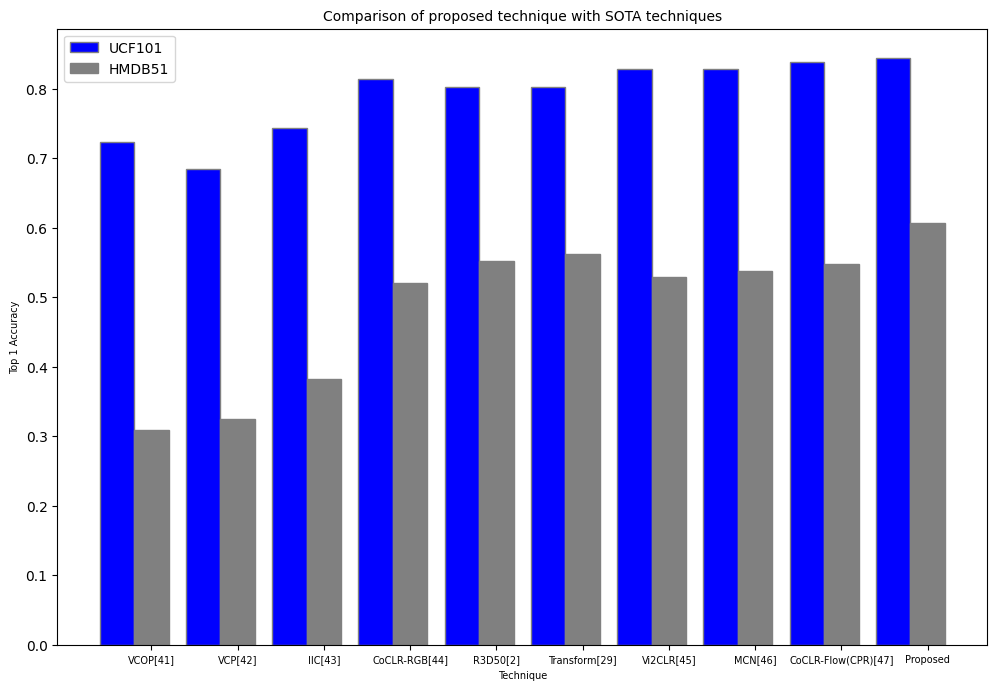

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# set width of bar
barWidth = 0.40
fig = plt.subplots(figsize =(12, 8))

# set height of bar
OBL_PSO = [0.724, 0.685, 0.744,  0.814,  0.8028,  0.8033, 0.828, 0.829, 0.838, 0.8443]
PSO = [0.309, 0.325, 0.383, 0.521, 0.552, 0.5620, 0.529, 0.538, 0.548, 0.60718]

# Set position of bar on X axis
br1 = np.arange(len(OBL_PSO))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, OBL_PSO, color ='blue', width = barWidth,
		edgecolor ='grey', label ='UCF101')
plt.bar(br2, PSO, color ='grey', width = barWidth,
		edgecolor ='grey', label ='HMDB51')

# Adding Xticks
plt.xlabel('Technique', fontweight ='normal', fontsize = 7)
plt.ylabel('Top 1 Accuracy', fontweight ='normal', fontsize = 7)
plt.xticks([r + barWidth for r in range(len(OBL_PSO))],['VCOP[41]', 'VCP[42]', 'IIC[43]', 'CoCLR-RGB[44]', 'R3D50[2]', 'Transform[29]', 'Vi2CLR[45]', 'MCN[46]', 'CoCLR-Flow(CPR)[47]', 'Proposed'], fontsize=7)
plt.title("Comparison of proposed technique with SOTA techniques",fontsize=10)
plt.legend()
plt.show()


ValueError: ignored

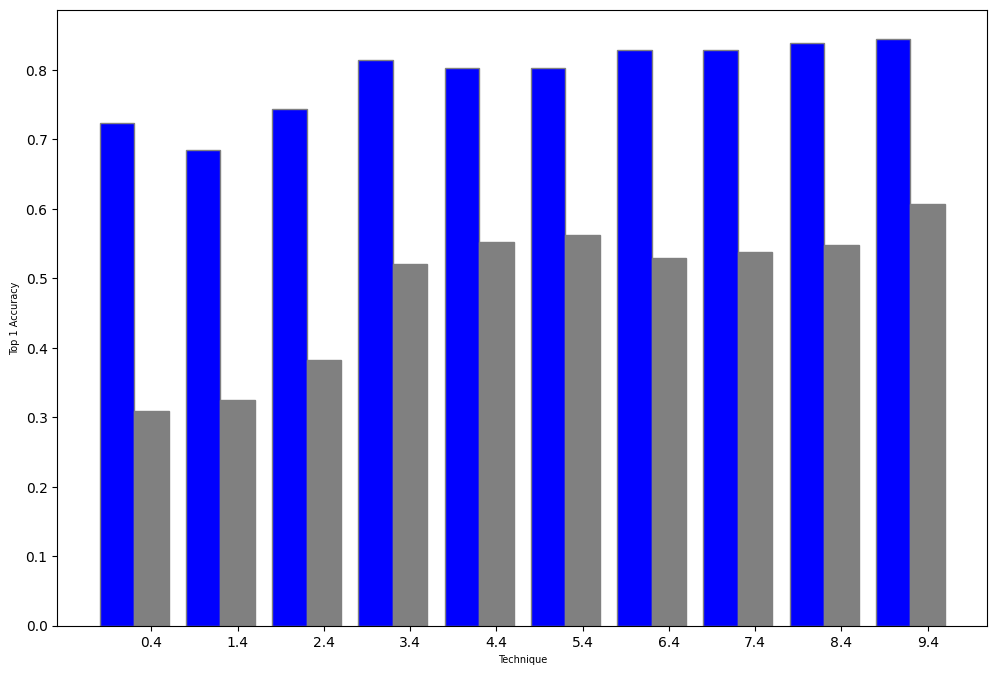

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# set width of bar
barWidth = 0.40
fig = plt.subplots(figsize =(12, 8))

# set height of bar
OBL_PSO = [0.724, 0.685, 0.744,  0.814,  0.8028,  0.8033, 0.828, 0.829, 0.838, 0.8443]
PSO = [0.309, 0.325, 0.383, 0.521, 0.552, 0.5620, 0.529, 0.538, 0.548, 0.60718]

# Set position of bar on X axis
br1 = np.arange(len(OBL_PSO))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, OBL_PSO, color ='blue', width = barWidth,
		edgecolor ='grey', label ='UCF101')
plt.bar(br2, PSO, color ='grey', width = barWidth,
		edgecolor ='grey', label ='HMDB51')

# Adding Xticks
plt.xlabel('Technique', fontweight ='normal', fontsize = 7)
plt.ylabel('Top 1 Accuracy', fontweight ='normal', fontsize = 7)
plt.xticks([r + barWidth for r in range(len(OBL_PSO))],['VCOP[30]', 'VCP[31]', 'IIC[32]', 'CoCLR-RGB[33]', 'R3D50[2]', 'Transform[34]', 'DSVH[35]', 'Vi2CLR[36]', 'MCN[36]', 'CoCLR-Flow(CPR)[37]', 'Proposed'], fontsize=7)
plt.title("Comparison of proposed technique with SOTA techniques",fontsize=10)
plt.legend()
plt.show()


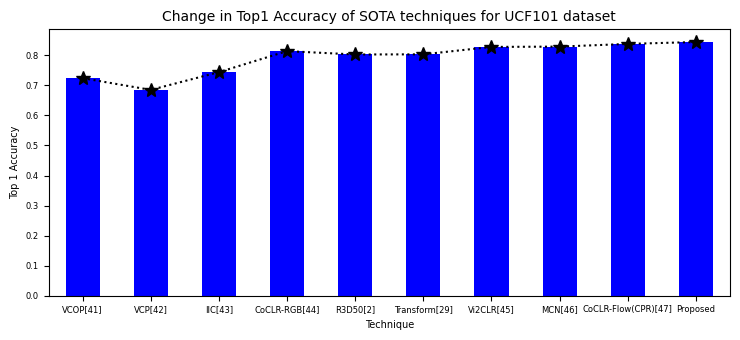

In [3]:
import matplotlib.pyplot as plt
import pandas as pd


plt.rcParams["figure.figsize"] = [7.50, 3.50]
plt.rcParams["figure.autolayout"] = True

df = pd.DataFrame(dict(data=OBL_PSO),index=['VCOP[41]', 'VCP[42]', 'IIC[43]', 'CoCLR-RGB[44]', 'R3D50[2]', 'Transform[29]', 'Vi2CLR[45]', 'MCN[46]', 'CoCLR-Flow(CPR)[47]', 'Proposed'])
fig, ax = plt.subplots()

df['data'].plot(kind='bar', color='blue',fontsize=6)
df['data'].plot(kind='line', linestyle='dotted', marker='*', color='black', ms=10)
plt.xlabel("Technique", fontsize=7 )
plt.ylabel("Top 1 Accuracy", fontsize=7)
plt.title('Change in Top1 Accuracy of SOTA techniques for UCF101 dataset', fontsize=10)


plt.show()

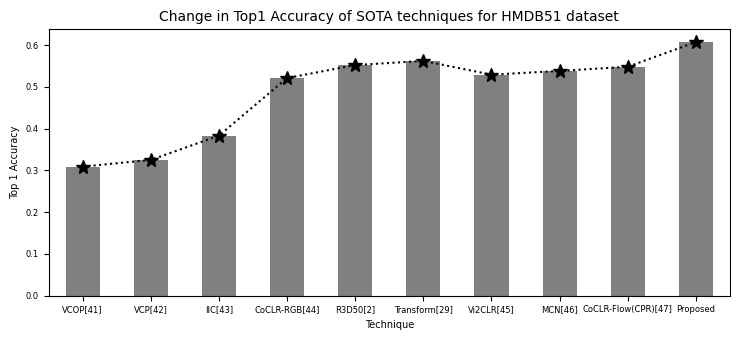

In [4]:
import matplotlib.pyplot as plt
import pandas as pd


plt.rcParams["figure.figsize"] = [7.50, 3.50]
plt.rcParams["figure.autolayout"] = True

df = pd.DataFrame(dict(data=PSO),index=['VCOP[41]', 'VCP[42]', 'IIC[43]', 'CoCLR-RGB[44]', 'R3D50[2]', 'Transform[29]', 'Vi2CLR[45]', 'MCN[46]', 'CoCLR-Flow(CPR)[47]', 'Proposed'])
fig, ax = plt.subplots()

df['data'].plot(kind='bar', color='grey',fontsize=6)
df['data'].plot(kind='line', linestyle='dotted', marker='*', color='black', ms=10)
plt.xlabel("Technique", fontsize=7)
plt.ylabel("Top 1 Accuracy", fontsize=7)
plt.title('Change in Top1 Accuracy of SOTA techniques for HMDB51 dataset', fontsize=10)


plt.show()

In [ ]:
'VCOP[30]', 'VCP[31]', 'IIC[32]', 'CoCLR-RGB[33]', 'R3D50[2]', 'Transform[34]', 'DSVH[35]', 'Vi2CLR[36]', 'MCN[36]', 'CoCLR-Flow(CPR)[37]', 'Proposed'

In [ ]:
'VCOP[37]', 'VCP[38]', 'IIC[39]', 'CoCLR-RGB[40]', 'R3D50[2]', 'Transform[41]', 'DSVH[42]', 'Vi2CLR[43], 'MCN[44]', 'CoCLR-Flow(CPR)[40]', 'Proposed'

In [ ]:
#UCF101 Layer4 feature Cosine similarity Distance
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/UCF101_R3D50layer4_ORIG_query.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] + '.npy'
    print(category)
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    a = point_a
    decision = np.dot(a, coef_.T) + delta
    a = decision#.argmax(axis=1)
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/UCF101_R3D50layer4_ORIG_proto_rev.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['feature']).reshape(2048,1,4,4)
        point_b = point_b.ravel().reshape(1, -1)
        b = point_b
        decision = np.dot(b, coef_.T) + delta
        b = decision#.argmax(axis=1)
    
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        #distance = np.linalg.norm(a - b)
        distance = cosine_similarity(a, b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'], ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
ApplyEyeMakeup.npy
The data  3556  is :  2048
ApplyEyeMakeup.npy
[{'similarity': array([[0.35549329]]), 'category': 'BoxingSpeedBag.npy'}, {'similarity': array([[0.37025487]]), 'category': 'Knitting.npy'}, {'similarity': array([[0.11649147]]), 'category': 'WalkingWithDog.npy'}, {'similarity': array([[0.36779742]]), 'category': 'WallPushups.npy'}, {'similarity': array([[0.33444386]]), 'category': 'Bowling.npy'}, {'similarity': array([[0.32882467]]), 'category': 'Haircut.npy'}, {'similarity': array([[0.34346578]]), 'category': 'Hammering.npy'}, {'similarity': array([[0.29203674]]), 'category': 'BenchPress.npy'}, {'similarity': array([[0.17095109]]), 'category': 'HighJump.npy'}, {'similarity': array([[0.32353964]]), 'category': 'Nunchucks.npy'}, {'similarity': array([[0.42635129]]), 'category': 'JumpRope.npy'}, {'similarity': array([[0.28790762]]), 'category': 'TaiChi.npy'}, {'similarity': array([[0.17603351]]), 'category': 'CleanAndJerk.

In [ ]:
#UCF101 Layer4 feature Euclidean Distance pretrained on UCF101
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/HMDB51_R3D50_ORIG_QUERY_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] #+ '.npy'
    print(category)
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    a = point_a
    decision = np.dot(a, coef_.T) + delta
    a = decision#.argmax(axis=1)
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_layer4_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features']).reshape(2048,1,4,4)
        point_b = point_b.ravel().reshape(1, -1)
        b = point_b
        decision = np.dot(b, coef_.T) + delta
        b = decision#.argmax(axis=1)
    
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        distance = np.linalg.norm(a - b)
        #distance = cosine_similarity(a, b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
10    2.920889       handstand
19    2.924823            walk
45    2.939652             hit
37    2.941095           stand
31    2.947581           drink
29    2.964391            pick
26    2.980379    climb_stairs
0     2.989134            kiss
1     3.006616            wave
30    3.012467             sit
15    3.028042           throw
12    3.098264      ride_horse
13    3.137182           catch
22    3.194072       shoot_bow
17    3.223899           sword
18    3.254389           laugh
33    3.255047           punch
39    3.265196  sword_exercise
41    3.291645            clap
25    3.305207      draw_sword
36    3.318918  swing_baseball
38    3.324388       ride_bike
11    3.328245          pullup
14    3.346476     shake_hands
3     3.405066             hug
9     3.427842            pour
7     3.433058         dribble
42    3.487958            kick
47    3.494929            golf
24    3.518581            push
44    3.580095     

In [ ]:
#HMDB51 Layer4 feature Cosine similarity pretrained on UCF101
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/HMDB51_R3D50_ORIG_QUERY_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] #+ '.npy'
    print(category)
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    a = point_a
    decision = np.dot(a, coef_.T) + delta
    a = decision#.argmax(axis=1)
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_layer4_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features']).reshape(2048,1,4,4)
        point_b = point_b.ravel().reshape(1, -1)
        b = point_b
        decision = np.dot(b, coef_.T) + delta
        b = decision#.argmax(axis=1)
    
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        #distance = np.linalg.norm(a - b)
        distance = cosine_similarity(a, b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'], ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
23   [[0.4365438295149734]]       shoot_gun
12   [[0.4274724414672848]]      ride_horse
0    [[0.4271594773377027]]            kiss
21   [[0.4044317774415787]]            talk
6   [[0.39670892639240835]]            chew
49  [[0.38956560312949623]]            jump
50   [[0.3835452651973591]]           smoke
32   [[0.3777384485400361]]           smile
16   [[0.3773872591647805]]             eat
22  [[0.37112533701064876]]       shoot_bow
5   [[0.36461100768333843]]           climb
2   [[0.36131049446818975]]           situp
9    [[0.3442223656714194]]            pour
7   [[0.33921478690007156]]         dribble
34   [[0.3303470467907216]]      shoot_ball
27  [[0.32890007352075384]]          pushup
10  [[0.31861679617659083]]       handstand
46   [[0.3095211628784618]]       kick_ball
48   [[0.3012234209270055]]            dive
11   [[0.2818673446800099]]          pullup
36   [[0.2537088197201813]]  swing_baseball
13  [[0.23343227515702897

In [ ]:
delta.shape

(51,)

In [ ]:
#Logistic regression training

from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = data_train#label_encoder.fit_transform(ytrain1)
# one hot encode
y_enc = to_categorical(data_train)



def net_input(X, W, b):
    return (X.dot(W) + b)

#def net_input(X, W):
#    return (X @ (W))



def softmax(z):
    return (np.float128(np.exp(z.T)) / np.sum(np.float128(np.exp(z)), axis=1)).T 

def to_classlabel(z):
    return z.argmax(axis=1)

def cross_entropy(output, y_target):
    return - np.sum(np.log(output) * (y_target), axis=1)


import numpy as np

eta = 0.01
l2 = 0.001

#W = np.random.normal(loc=0.0, scale=0.01, size=(Xtrain1.shape[1], 51))
#W = np.zeros((Xtrain1.shape[1], 51))
W =  coef_.T
#W = W
#W = np.load('/content/W1500_UCF101.npy')
#B = np.random.normal(loc=0.0, scale=0.01, size=(51))
B = delta #np.zeros(51)
#B = B
#B = np.load('/content/B1500_UCF101.npy')
print("weights")
print(W)
print("bias")
print(B)
global W, B
N = Xtrain1.shape[0]
for i in range(100):
  print(str(i) +"th epoch")
  net = net_input(Xtrain1, W, B)
  softm = softmax(net)
  diff = (softm - y_enc)
  for i in range(diff.shape[0]):
    for j in range(diff.shape[1]):
      if np.isnan(diff[i][j]) == True:
        diff[i][j] = 0.000001

  print("differential")
  print(diff)
  mse = np.mean(diff, axis=0)
  #print("mse")
  #print(mse)
    # gradient -> n_features x n_classes
  #grad = 1/N * (np.dot(Xtrain1.T, diff))
  grad = 1/N * (Xtrain1.T @ diff)
  for i in range(grad.shape[0]):
    for j in range(grad.shape[1]):
      if np.isnan(grad[i][j]) == True:
        grad[i][j] = 0.0000001
  print("gradient")
  print(grad)
    # update in opp. direction of the cost gradient
  W -= (eta * grad + 2 * eta * l2 * W)
  B -= (eta * np.sum(diff, axis=0))
  for i in range(W.shape[0]):
    for j in range(W.shape[1]):
      if np.isnan(W[i][j]) == True:
        W[i][j] = 0
  for i in range(B.shape[0]):
    if np.isnan(B[i]) == True:
        B[i] = 0.00000001
  print("weights")
  print(W)
  print("bias")
  print(B)


    # compute cost of the whole epoch
  net = net_input(Xtrain1, W, B)
  softm = softmax(net)
  cross_ent = cross_entropy(output=softm, y_target=y_enc)
  net_f = net_input(Xtrain1, W, B)
  softm = softmax(net_f)
  smax = to_classlabel(softm)
  print("accuracy score is " + str(accuracy_score(data_train, smax)))
  #to_classlabel(softmax(net_input(Xtest1, W, B)))
  net_f = net_input(Xtest1, W, B)
  softm = softmax(net_f)
  smax = to_classlabel(softm)
  print("test accuracy score is " + str(accuracy_score(data_test, smax)))


weights
[[-3.51250840e-05  1.85925411e-05  2.16650640e-04 ...  1.14077224e-04
   4.78640739e-05 -1.97894988e-04]
 [ 1.41815412e-04 -8.49719903e-06  6.84279207e-04 ... -2.26159402e-05
   6.92596465e-05 -1.65672100e-04]
 [-1.23778195e-06  8.63378300e-05  4.03911845e-04 ... -5.48957955e-05
   3.09244606e-05 -6.36580938e-05]
 ...
 [ 4.21304904e-05 -1.35407362e-04 -4.33372812e-05 ... -1.42646543e-04
   1.21910081e-04 -1.18017574e-04]
 [-2.10891560e-05 -2.22962257e-04 -8.28707875e-05 ... -1.80400608e-04
   1.22261507e-04 -1.04969749e-04]
 [-4.55610224e-05 -2.03947300e-04  1.64142696e-04 ... -1.17171221e-04
   2.53526069e-05 -4.29025668e-06]]
bias
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -6.23226253e-07  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  3.86774526e-07  1.72797863e-07  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.000000

KeyboardInterrupt: ignored

In [ ]:
#HMDB51 Layer4 feature Euclidean Distance
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/HMDB51_R3D50_ORIG_QUERY_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] #+ '.npy'
    print(category)
    
    point_a = np.array(item['features']).reshape(2048,1,4,4)
    point_a = point_a.ravel().reshape(1, -1)
    a = point_a
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    a = softmax(net_input(a, W, B))
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_layer4_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features']).reshape(2048,1,4,4)
        point_b = point_b.ravel().reshape(1, -1)
        b = point_b
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        b = softmax(net_input(b, W, B))
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        #distance = np.linalg.norm(a - b)
        distance = cosine_similarity(a, b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'], ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
12    [[0.002745958521397193]]      ride_horse
10   [[0.0025110949687458003]]       handstand
19   [[0.0024580781179524155]]            walk
15    [[0.002416553606174372]]           throw
8     [[0.002380521306544894]]            turn
40   [[0.0023477412859912723]]       cartwheel
38   [[0.0020827523478753707]]       ride_bike
22   [[0.0019146264487556108]]       shoot_bow
21   [[0.0017829311839445135]]            talk
30   [[0.0017543588517485852]]             sit
16   [[0.0017217217080211544]]             eat
13   [[0.0016719706541181041]]           catch
33   [[0.0016614282958263599]]           punch
24   [[0.0016252530574161165]]            push
31   [[0.0015381781368714077]]           drink
17   [[0.0012152491487661804]]           sword
0    [[0.0009103811203220077]]            kiss
6    [[0.0008672669584344654]]            chew
41   [[0.0008275022576390062]]            clap
39   [[0.0007811180439057123]]  sword_exercise
42   [[0.

In [ ]:
#SVM iterations - 10 weights fed to logistic regression at 24th epoch - 0.6032 top 1 accuracy HMDB51
#SVM iterations - 10 weights fed to logistic regression at 24th epoch -  top 1 accuracy UCF101

#SVM iterations - 10 weights fed to logistic regression at 100th epoch - 0.6013 top 1 accuracy HMDB51 0.6490 top 5 accuracy
#SVM iterations - 10 weights fed to logistic regression and cosine similarity at 100th epoch - 0.6026 top 1 accuracy 
#HMDB51 0.8777 top 5 accuracy 

#idea1 - major information extraction using wavelet transforms and training

In [ ]:
Hybrid SVM-Logisticregression + Layer4R3D50 feature

Next Paper - Learning Clustered-Prototypes of Optimized Intermediate Deep
Spatio-Temporal Features using Conditional Hybrid SVM-Softmax
for Efficient Video Retrieval



In [ ]:
import numpy as np

def KL(a, b):
    a = np.asarray(a, dtype=np.float)
    b = np.asarray(b, dtype=np.float)

    return np.sum(np.where(a != 0, a * np.log(a / b), 0))


values1 = [1.346112,1.337432,1.246655]
values2 = [1.033836,1.082015,1.117323]

print (KL(values1, values2))

0.7752796240788413


<ipython-input-4-bceb233456f7>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  a = np.asarray(a, dtype=np.float)
<ipython-input-4-bceb233456f7>:5: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  b = np.asarray(b, dtype=np.float)


In [ ]:
import abc
import logging
import math

#import sampling as smp
import analytics

In [ ]:
!pip install sampling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement sampling (from versions: none)
ERROR: No matching distribution found for sampling


In [ ]:
!git clone https://github.com/Ritam-Guha/Py_FS.git

Cloning into 'Py_FS'...
remote: Enumerating objects: 2210, done.
remote: Counting objects: 100% (189/189), done.
remote: Compressing objects: 100% (84/84), done.
remote: Total 2210 (delta 112), reused 118 (delta 101), pack-reused 2021
Receiving objects: 100% (2210/2210), 42.49 MiB | 30.49 MiB/s, done.
Resolving deltas: 100% (1320/1320), done.


In [ ]:
%cd /content/Py_FS

/content/Py_FS


In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
"""

Programmer: Ali Hussain Khan
Date of Development: 15/10/2020
This code has been developed according to the procedures mentioned in the following research article:
"Khanesar, M. A., Teshnehlab, M., & Shoorehdeli, M. A. (2007, June). 
A novel binary particle swarm optimization. 
In 2007 Mediterranean conference on control & automation (pp. 1-6). IEEE."

"""
import numpy as np
import time
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn import datasets

def initialize(num_agents, num_features):
    # define min and max number of features
    min_features = int(0.3 * num_features)
    max_features = int(0.6 * num_features)

    # initialize the agents with zeros
    agents = np.zeros((num_agents, num_features))

    # select random features for each agent
    for agent_no in range(num_agents):

        # find random indices
        cur_count = np.random.randint(min_features, max_features)
        temp_vec = np.random.rand(1, num_features)
        temp_idx = np.argsort(temp_vec)[0][0:cur_count]

        # select the features with the ranom indices
        agents[agent_no][temp_idx] = 1   

    return agents

def sort_agents(agents, obj, train_X, val_X, train_Y, val_Y, fitness=None):
    # sort the agents according to fitness
    #train_X, val_X, train_Y, val_Y = data.train_X, data.val_X, data.train_Y, data.val_Y
    (obj_function, weight_acc) = obj
   
    if fitness is None:
        # if there is only one agent
        if len(agents.shape) == 1:
            num_agents = 1
            fitness = obj_function(agents, train_X, val_X, train_Y, val_Y, weight_acc)
            return agents, fitness

        # for multiple agents
        else:
            num_agents = agents.shape[0]
            fitness = np.zeros(num_agents)
            for id, agent in enumerate(agents):
                fitness[id] = obj_function(agent, train_X, val_X, train_Y, val_Y, weight_acc)

    idx = np.argsort(-fitness)
    sorted_agents = agents[idx].copy()
    sorted_fitness = fitness[idx].copy()

    return sorted_agents, sorted_fitness


from Py_FS.wrapper.nature_inspired._utilities import Solution, Data, display, compute_fitness, Conv_plot
from Py_FS.wrapper.nature_inspired._transfer_functions import get_trans_function


def PSO(num_agents, max_iter, train_data, train_label, test_data, test_label, obj_function=compute_fitness, trans_func_shape='u', save_conv_graph=False):
    
    # Particle Swarm Optimizer
    ############################### Parameters ####################################
    #                                                                             #
    #   num_agents: number of particles                                           #
    #   max_iter: maximum number of generations                                   #
    #   train_data: training samples of data                                      #
    #   train_label: class labels for the training samples                        #                
    #   obj_function: the function to maximize while doing feature selection      #
    #   trans_function_shape: shape of the transfer function used                 #
    #   save_conv_graph: boolean value for saving convergence graph               #
    #                                                                             #
    ###############################################################################
    
    short_name = 'PSO'
    agent_name = 'Particle'
    train_data, train_label = np.array(train_data), np.array(train_label)
    test_data, train_label = np.array(train_data), np.array(train_label)
    num_features = train_data.shape[1]
    trans_function = get_trans_function(trans_func_shape)
    
    # setting up the objectives
    weight_acc = None
    if(obj_function==compute_fitness):
        weight_acc = float(input('Weight for the classification accuracy [0-1]: '))
    obj = (obj_function, weight_acc)
    compute_accuracy = (compute_fitness, 1) # compute_accuracy is just compute_fitness with accuracy weight as 1

    # initialize particles and Leader (the agent with the max fitness)
    particles = initialize(num_agents, num_features)
    fitness = np.zeros(num_agents)
    accuracy = np.zeros(num_agents)
    Leader_agent = np.zeros((1, num_features))
    Leader_fitness = float("-inf")
    Leader_accuracy = float("-inf")

    # initialize convergence curves
    convergence_curve = {}
    convergence_curve['fitness'] = np.zeros(max_iter)

    # initialize data class
    data = Data()
    #val_size = float(input('Enter the percentage of data wanted for valdiation [0, 100]: '))/100
    #data.train_X, data.val_X, data.train_Y, data.val_Y = train_test_split(train_data, train_label, stratify=train_label, test_size=val_size)
    train_X = train_data
    val_X = test_data
    train_Y = train_label
    val_Y = test_label

    # create a solution object
    solution = Solution()
    solution.num_agents = num_agents
    solution.max_iter = max_iter
    solution.num_features = num_features
    solution.obj_function = obj_function

    # rank initial particles
    particles, fitness = sort_agents(particles, obj, train_X, val_X, train_Y, val_Y)

    # start timer
    start_time = time.time()

    # initialize global and local best particles
    globalBestParticle = [0 for i in range(num_features)]
    globalBestFitness = float("-inf")
    localBestParticle = [ [ 0 for i in range(num_features) ] for j in range(num_agents) ] 
    localBestFitness = [float("-inf") for i in range(num_agents) ]
    weight = 1.0 
    velocity = [ [ 0.0 for i in range(num_features) ] for j in range(num_agents) ]
    
    for iter_no in range(max_iter):
        print('\n================================================================================')
        print('                          Iteration - {}'.format(iter_no+1))
        print('================================================================================\n')
        
        # update weight
        weight = 1.0 - (iter_no / max_iter)
        
        # update the velocity
        for i in range(num_agents):
            for j in range(num_features):
                velocity[i][j] = (weight*velocity[i][j])
                r1, r2 = np.random.random(2)
                velocity[i][j] = velocity[i][j] + (r1 * (localBestParticle[i][j] - particles[i][j]))
                velocity[i][j] = velocity[i][j] + (r2 * (globalBestParticle[j] - particles[i][j]))
       
        # updating position of particles
        for i in range(num_agents):
            for j in range(num_features):
                trans_value = trans_function(velocity[i][j])
                if (np.random.random() < trans_value): 
                    particles[i][j] = 1
                else:
                    particles[i][j] = 0
                 
        # updating fitness of particles
        particles, fitness = sort_agents(particles, obj, data)
        display(particles, fitness, agent_name)
        
        
        # updating the global best and local best particles
        for i in range(num_agents):
            if fitness[i]>localBestFitness[i]:
                localBestFitness[i]=fitness[i]
                localBestParticle[i]=particles[i][:]

            if fitness[i]>globalBestFitness:
                globalBestFitness=fitness[i]
                globalBestParticle=particles[i][:]

        # update Leader (best agent)
        if globalBestFitness > Leader_fitness:
            Leader_agent = globalBestParticle.copy()
            Leader_fitness = globalBestFitness.copy()

        convergence_curve['fitness'][iter_no] = np.mean(fitness)

    # compute final accuracy
    Leader_agent, Leader_accuracy = sort_agents(Leader_agent, compute_accuracy, data)
    particles, accuracy = sort_agents(particles, compute_accuracy, data)

    print('\n================================================================================')
    print('                                    Final Result                                  ')
    print('================================================================================\n')
    print('Leader ' + agent_name + ' Dimension : {}'.format(int(np.sum(Leader_agent))))
    print('Leader ' + agent_name + ' Fitness : {}'.format(Leader_fitness))
    print('Leader ' + agent_name + ' Classification Accuracy : {}'.format(Leader_accuracy))
    print('\n================================================================================\n')

    # stop timer
    end_time = time.time()
    exec_time = end_time - start_time

    # plot convergence graph
    fig, axes = Conv_plot(convergence_curve)
    if(save_conv_graph):
        plt.savefig('convergence_graph_'+ short_name + '.jpg')
    plt.show()

    # update attributes of solution
    solution.best_agent = Leader_agent
    solution.best_fitness = Leader_fitness
    solution.best_accuracy = Leader_accuracy
    solution.convergence_curve = convergence_curve
    solution.final_particles = particles
    solution.final_fitness = fitness
    solution.final_accuracy = accuracy
    solution.execution_time = exec_time

    return solution


if __name__ == '__main__':
    
    #data = datasets.load_digits()
    #data.train_X, data.val_X, data.train_Y, data.val_Y = train_test_split(data.data, data.target, stratify=data.target, test_size=0.2)

    #PSO(20, 100, data.train_X, data.train_Y, data.val_X, data.val_Y, save_conv_graph=True)
    PSO(20, 10, Xtrain1, data_train, Xtest1, data_test, save_conv_graph=True)




Weight for the classification accuracy [0-1]: 0.9


ValueError: ignored

Weight for the classification accuracy [0-1]: 1
Enter the percentage of data wanted for valdiation [0, 100]: 20

                          Iteration - 1


Number of agents: 20

------------- Best Agent ---------------
Fitness: 0.5866477272727273
Number of Features: 16447
----------------------------------------

Particle 1 - Fitness: 0.5866477272727273, Number of Features: 16447
Particle 2 - Fitness: 0.5838068181818182, Number of Features: 16407
Particle 3 - Fitness: 0.5838068181818182, Number of Features: 16364
Particle 4 - Fitness: 0.5838068181818182, Number of Features: 16276
Particle 5 - Fitness: 0.5823863636363636, Number of Features: 16342
Particle 6 - Fitness: 0.5809659090909091, Number of Features: 16380
Particle 7 - Fitness: 0.5809659090909091, Number of Features: 16486
Particle 8 - Fitness: 0.5809659090909091, Number of Features: 16333
Particle 9 - Fitness: 0.578125, Number of Features: 16247
Particle 10 - Fitness: 0.578125, Number of Features: 16289
Particle 11 - Fitness: 0.

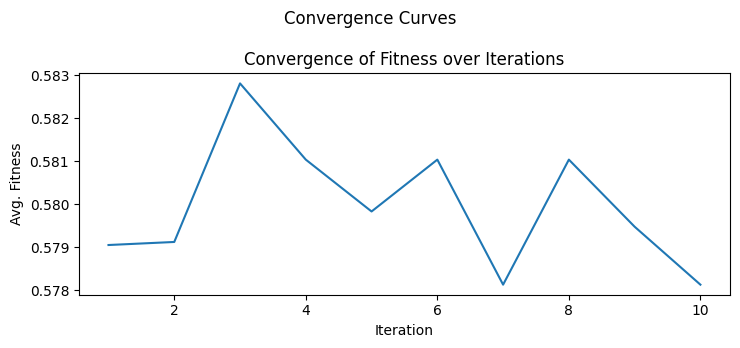

In [ ]:
"""

Programmer: Ali Hussain Khan
Date of Development: 15/10/2020
This code has been developed according to the procedures mentioned in the following research article:
"Khanesar, M. A., Teshnehlab, M., & Shoorehdeli, M. A. (2007, June). 
A novel binary particle swarm optimization. 
In 2007 Mediterranean conference on control & automation (pp. 1-6). IEEE."

"""
import numpy as np
import time
import matplotlib.pyplot as plt

import numpy as np
import time
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn import datasets

def initialize(num_agents, num_features):
    # define min and max number of features
    min_features = int(0.001 * num_features)
    max_features = int(0.002 * num_features)

    # initialize the agents with zeros
    agents = np.zeros((num_agents, num_features))

    # select random features for each agent
    for agent_no in range(num_agents):

        # find random indices
        cur_count = np.random.randint(min_features, max_features)
        temp_vec = np.random.rand(1, num_features)
        temp_idx = np.argsort(temp_vec)[0][0:cur_count]

        # select the features with the ranom indices
        agents[agent_no][temp_idx] = 1   

    return agents


from sklearn.model_selection import train_test_split
from sklearn import datasets

from Py_FS.wrapper.nature_inspired._utilities import Solution, Data, sort_agents, display, compute_fitness, Conv_plot
from Py_FS.wrapper.nature_inspired._transfer_functions import get_trans_function


def PSO(num_agents, max_iter, train_data, train_label, obj_function=compute_fitness, trans_func_shape='s', save_conv_graph=False):
    
    # Particle Swarm Optimizer
    ############################### Parameters ####################################
    #                                                                             #
    #   num_agents: number of particles                                           #
    #   max_iter: maximum number of generations                                   #
    #   train_data: training samples of data                                      #
    #   train_label: class labels for the training samples                        #                
    #   obj_function: the function to maximize while doing feature selection      #
    #   trans_function_shape: shape of the transfer function used                 #
    #   save_conv_graph: boolean value for saving convergence graph               #
    #                                                                             #
    ###############################################################################
    
    short_name = 'PSO'
    agent_name = 'Particle'
    train_data, train_label = np.array(train_data), np.array(train_label)
    num_features = train_data.shape[1]
    trans_function = get_trans_function(trans_func_shape)
    
    # setting up the objectives
    weight_acc = None
    if(obj_function==compute_fitness):
        weight_acc = float(input('Weight for the classification accuracy [0-1]: '))
    obj = (obj_function, weight_acc)
    compute_accuracy = (compute_fitness, 1) # compute_accuracy is just compute_fitness with accuracy weight as 1

    # initialize particles and Leader (the agent with the max fitness)
    particles = initialize(num_agents, num_features)
    fitness = np.zeros(num_agents)
    accuracy = np.zeros(num_agents)
    Leader_agent = np.zeros((1, num_features))
    Leader_fitness = float("-inf")
    Leader_accuracy = float("-inf")

    # initialize convergence curves
    convergence_curve = {}
    convergence_curve['fitness'] = np.zeros(max_iter)

    # initialize data class
    data = Data()
    val_size = float(input('Enter the percentage of data wanted for valdiation [0, 100]: '))/100
    data.train_X, data.val_X, data.train_Y, data.val_Y = train_test_split(train_data, train_label, stratify=train_label, test_size=val_size)

    # create a solution object
    solution = Solution()
    solution.num_agents = num_agents
    solution.max_iter = max_iter
    solution.num_features = num_features
    solution.obj_function = obj_function

    # rank initial particles
    particles, fitness = sort_agents(particles, obj, data)

    # start timer
    start_time = time.time()

    # initialize global and local best particles
    globalBestParticle = [0 for i in range(num_features)]
    globalBestFitness = float("-inf")
    localBestParticle = [ [ 0 for i in range(num_features) ] for j in range(num_agents) ] 
    localBestFitness = [float("-inf") for i in range(num_agents) ]
    weight = 1.0 
    velocity = [ [ 0.0 for i in range(num_features) ] for j in range(num_agents) ]
    
    for iter_no in range(max_iter):
        print('\n================================================================================')
        print('                          Iteration - {}'.format(iter_no+1))
        print('================================================================================\n')
        
        # update weight
        weight = 1.0 - (iter_no / max_iter)
        
        # update the velocity
        for i in range(num_agents):
            for j in range(num_features):
                velocity[i][j] = (weight*velocity[i][j])
                r1, r2 = np.random.random(2)
                velocity[i][j] = velocity[i][j] + (r1 * (localBestParticle[i][j] - particles[i][j]))
                velocity[i][j] = velocity[i][j] + (r2 * (globalBestParticle[j] - particles[i][j]))
       
        # updating position of particles
        for i in range(num_agents):
            for j in range(num_features):
                trans_value = trans_function(velocity[i][j])
                if (np.random.random() < trans_value): 
                    particles[i][j] = 1
                else:
                    particles[i][j] = 0
                 
        # updating fitness of particles
        particles, fitness = sort_agents(particles, obj, data)
        display(particles, fitness, agent_name)
        
        
        # updating the global best and local best particles
        for i in range(num_agents):
            if fitness[i]>localBestFitness[i]:
                localBestFitness[i]=fitness[i]
                localBestParticle[i]=particles[i][:]

            if fitness[i]>globalBestFitness:
                globalBestFitness=fitness[i]
                globalBestParticle=particles[i][:]

        # update Leader (best agent)
        if globalBestFitness > Leader_fitness:
            Leader_agent = globalBestParticle.copy()
            Leader_fitness = globalBestFitness.copy()

        convergence_curve['fitness'][iter_no] = np.mean(fitness)

    # compute final accuracy
    Leader_agent, Leader_accuracy = sort_agents(Leader_agent, compute_accuracy, data)
    particles, accuracy = sort_agents(particles, compute_accuracy, data)

    print('\n================================================================================')
    print('                                    Final Result                                  ')
    print('================================================================================\n')
    print('Leader ' + agent_name + ' Dimension : {}'.format(int(np.sum(Leader_agent))))
    print('Leader ' + agent_name + ' Fitness : {}'.format(Leader_fitness))
    print('Leader ' + agent_name + ' Classification Accuracy : {}'.format(Leader_accuracy))
    print('\n================================================================================\n')

    # stop timer
    end_time = time.time()
    exec_time = end_time - start_time

    # plot convergence graph
    fig, axes = Conv_plot(convergence_curve)
    if(save_conv_graph):
        plt.savefig('convergence_graph_'+ short_name + '.jpg')
    plt.show()

    # update attributes of solution
    solution.best_agent = Leader_agent
    solution.best_fitness = Leader_fitness
    solution.best_accuracy = Leader_accuracy
    solution.convergence_curve = convergence_curve
    solution.final_particles = particles
    solution.final_fitness = fitness
    solution.final_accuracy = accuracy
    solution.execution_time = exec_time

    return solution


if __name__ == '__main__':
    
    #data = datasets.load_digits()
    #PSO(20, 100, data.data, data.target, save_conv_graph=True)
    sol = PSO(20, 10, Xtrain1, data_train, save_conv_graph=True)




In [ ]:
solution = sol
Xtrain_selected_features = Xtrain1[:,solution.best_agent==1]
Xtest_selected_features = Xtest1[:,solution.best_agent==1]


In [ ]:
solution = sol
Xtrain_selected_features = Xtrain1[:,solution.best_agent==1]
Xtest_selected_features = Xtest1[:,solution.best_agent==1]
#Xproto_selected_features = Xproto1[:,solution.best_agent==1]

#Training
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

log1 = LogisticRegression(C=0.25, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=25, multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=1234, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

#log1 = LogisticRegression()

#rnd = RandomForestClassifier(n_estimators=100)
#log1 = SVC()

log1.fit(Xtrain_selected_features, data_train)

ypred = log1.predict(Xtest_selected_features)
print(accuracy_score(data_test, ypred))



0.8530266983875231


/usr/local/lib/python3.9/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(


In [ ]:
Xtrain1.shape

(9537, 32768)

In [ ]:
log1.intercept_.shape

(101,)

In [ ]:
log1.coef_.T.shape

(32768, 101)

In [ ]:
def to_classlabel(z):
    return z.argmax(axis=1)

In [ ]:
ypred = to_classlabel(Xtrain1.dot(log1.coef_.T) + log1.intercept_)

print(accuracy_score(data_train, ypred))

0.9732620320855615


In [ ]:
#UCF101 Layer4 feature Euclidean Distance
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/UCF101_R3D50layer4_ORIG_query.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] + '.npy'
    print(category)
    
    point_a = np.array(item['features'])
    #point_a = point_a.ravel().reshape(1, -1)
    a = point_a
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/UCF101_R3D50layer4_ORIG_proto_rev.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['feature']).reshape(2048,1,4,4)
        #point_b = point_b.ravel().reshape(1, -1)
        b = point_b
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        distance = np.linalg.norm(a - b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
[{'similarity': 125.7636, 'category': 'BoxingSpeedBag.npy'}, {'similarity': 121.56622, 'category': 'Knitting.npy'}, {'similarity': 128.3557, 'category': 'WalkingWithDog.npy'}, {'similarity': 121.55314, 'category': 'WallPushups.npy'}, {'similarity': 128.4807, 'category': 'Bowling.npy'}, {'similarity': 111.20812, 'category': 'Haircut.npy'}, {'similarity': 127.55994, 'category': 'Hammering.npy'}, {'similarity': 129.75732, 'category': 'BenchPress.npy'}, {'similarity': 125.47383, 'category': 'HighJump.npy'}, {'similarity': 127.67175, 'category': 'Nunchucks.npy'}, {'similarity': 126.458466, 'category': 'JumpRope.npy'}, {'similarity': 134.24971, 'category': 'TaiChi.npy'}, {'similarity': 131.11604, 'category': 'CleanAndJerk.npy'}, {'similarity': 122.03872, 'category': 'Lunges.npy'}, {'similarity': 140.49918, 'category': 'GolfSwing.npy'}, {'similarity': 130.91516, 'category': 'Fencing.npy'}, {'similarity': 131.66174, 'category': 'Rowing.npy'}, 

In [ ]:
#HMDB51 Layer4 feature Euclidean Distance
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/HMDB51_R3D50_ORIG_QUERY_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] #+ '.npy'
    print(category)
    
    point_a = np.array(item['features']).reshape(2048,1,4,4)
    #point_a = point_a.ravel().reshape(1, -1)
    a = point_a
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_layer4_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features']).reshape(2048,1,4,4)
        #point_b = point_b.ravel().reshape(1, -1)
        b = point_b
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        distance = np.linalg.norm(a - b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
21  107.312248            talk
16  107.324570             eat
23  107.890358       shoot_gun
31  107.908150           drink
30  108.498718             sit
34  108.593140      shoot_ball
10  109.339211       handstand
0   110.635071            kiss
12  110.701561      ride_horse
11  111.145912          pullup
32  111.725204           smile
33  111.798576           punch
38  111.799965       ride_bike
41  112.100479            clap
14  112.393150     shake_hands
17  112.780823           sword
6   112.800926            chew
24  112.803169            push
15  113.072151           throw
39  113.334503  sword_exercise
18  114.567894           laugh
25  114.586884      draw_sword
22  114.989365       shoot_bow
42  115.582359            kick
13  116.368736           catch
3   116.942596             hug
7   117.376122         dribble
27  120.943802          pushup
44  121.047874      brush_hair
4   121.298027         fencing
9   124.066437     

In [ ]:
#HMDB51 Layer4 feature Euclidean Distance
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/HMDB51_R3D50_ORIG_QUERY_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] #+ '.npy'
    print(category)
    
    point_a = np.array(item['features']).reshape(2048,1,4,4)
    #point_a = point_a.ravel().reshape(1, -1)
    a = point_a
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_layer4_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features']).reshape(2048,1,4,4)
        #point_b = point_b.ravel().reshape(1, -1)
        b = point_b
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        distance = np.linalg.norm(a - b)
        #distance = cosine_similarity(a, b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
21  107.312248            talk
16  107.324570             eat
23  107.890358       shoot_gun
31  107.908150           drink
30  108.498718             sit
34  108.593140      shoot_ball
10  109.339211       handstand
0   110.635071            kiss
12  110.701561      ride_horse
11  111.145912          pullup
32  111.725204           smile
33  111.798576           punch
38  111.799965       ride_bike
41  112.100479            clap
14  112.393150     shake_hands
17  112.780823           sword
6   112.800926            chew
24  112.803169            push
15  113.072151           throw
39  113.334503  sword_exercise
18  114.567894           laugh
25  114.586884      draw_sword
22  114.989365       shoot_bow
42  115.582359            kick
13  116.368736           catch
3   116.942596             hug
7   117.376122         dribble
27  120.943802          pushup
44  121.047874      brush_hair
4   121.298027         fencing
9   124.066437     

In [ ]:
#HMDB51 Layer4 feature Cosine Similarity Distance
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/HMDB51_R3D50_ORIG_QUERY_layer4.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] #+ '.npy'
    print(category)
    
    point_a = np.array(item['features'])#.reshape(2048,1,4,4)
    point_a = point_a.ravel().reshape(1, -1)
    a = point_a
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/HMDB51_R3D50_ORIG_proto_layer4_revise.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['features'])#.reshape(2048,1,4,4)
        point_b = point_b.ravel().reshape(1, -1)
        b = point_b
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        #distance = np.linalg.norm(a - b)
        distance = cosine_similarity(a, b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'], ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
1   [[0.52310526]]            wave
19   [[0.5221846]]            walk
37    [[0.519547]]           stand
21  [[0.51381874]]            talk
8    [[0.5126678]]            turn
12  [[0.50970995]]      ride_horse
22  [[0.50769365]]       shoot_bow
15  [[0.50680393]]           throw
30   [[0.5060377]]             sit
16   [[0.5056581]]             eat
39   [[0.5051643]]  sword_exercise
31  [[0.50450206]]           drink
13   [[0.5012995]]           catch
38   [[0.5004986]]       ride_bike
24  [[0.49835026]]            push
14  [[0.49561128]]     shake_hands
17   [[0.4954392]]           sword
41  [[0.49451163]]            clap
25  [[0.49258393]]      draw_sword
7   [[0.49005288]]         dribble
18  [[0.48474672]]           laugh
33    [[0.482229]]           punch
6    [[0.4787609]]            chew
0   [[0.47710052]]            kiss
42  [[0.47497317]]            kick
47  [[0.47461727]]            golf
36  [[0.47038895]]  swing_baseball
27  

In [ ]:
##UCF101 Layer4 feature Cosine Similarity Distance
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/UCF101_R3D50layer4_ORIG_query.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] + '.npy'
    print(category)
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    a = point_a
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/UCF101_R3D50layer4_ORIG_proto_rev.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['feature'])
        point_b = point_b.ravel().reshape(1, -1)
        b = point_b
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        #distance = np.linalg.norm(a - b)
        distance = cosine_similarity(a, b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'], ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
[{'similarity': array([[0.543062]], dtype=float32), 'category': 'BoxingSpeedBag.npy'}, {'similarity': array([[0.56489444]], dtype=float32), 'category': 'Knitting.npy'}, {'similarity': array([[0.46648258]], dtype=float32), 'category': 'WalkingWithDog.npy'}, {'similarity': array([[0.5598968]], dtype=float32), 'category': 'WallPushups.npy'}, {'similarity': array([[0.49846473]], dtype=float32), 'category': 'Bowling.npy'}, {'similarity': array([[0.6405418]], dtype=float32), 'category': 'Haircut.npy'}, {'similarity': array([[0.5352762]], dtype=float32), 'category': 'Hammering.npy'}, {'similarity': array([[0.5141665]], dtype=float32), 'category': 'BenchPress.npy'}, {'similarity': array([[0.5026811]], dtype=float32), 'category': 'HighJump.npy'}, {'similarity': array([[0.531916]], dtype=float32), 'category': 'Nunchucks.npy'}, {'similarity': array([[0.5454074]], dtype=float32), 'category': 'JumpRope.npy'}, {'similarity': array([[0.46747053]], dt

In [ ]:
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/UCF101_R3D50layer4_ORIG_query.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] + '.npy'
    print(category)
    
    point_a = np.array(item['features'])
    #point_a = point_a.ravel().reshape(1, -1)
    #a = point_a
    t = [] 
    for i in range(len(point_a)):
      t.append((np.max(point_a[i][0]) + np.min(point_a[i][0]))/2)
    a = np.array(t)
    #print(a.shape)
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    #a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/UCF101_R3D50layer4_ORIG_proto_rev.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['feature']).reshape(2048,1,4,4)
        #print(point_b.shape)
        #point_b = point_b.ravel().reshape(1, -1)
        #b = point_b
        t = [] 
        for i in range(len(point_b)):
          t.append((np.max(point_b[i][0]) + np.min(point_b[i][0]))/2)
        b = np.array(t)
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        #b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        distance = np.linalg.norm(a - b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
HulaHoop.npy
The data  701  is :  2048
HulaHoop.npy
[{'similarity': 30.08704412439548, 'category': 'BoxingSpeedBag.npy'}, {'similarity': 31.269345356868058, 'category': 'Knitting.npy'}, {'similarity': 29.310172943293434, 'category': 'WalkingWithDog.npy'}, {'similarity': 29.161983963527323, 'category': 'WallPushups.npy'}, {'similarity': 30.855644042774866, 'category': 'Bowling.npy'}, {'similarity': 31.014550961140042, 'category': 'Haircut.npy'}, {'similarity': 30.001767189781518, 'category': 'Hammering.npy'}, {'similarity': 28.97224193172626, 'category': 'BenchPress.npy'}, {'similarity': 28.891542571355256, 'category': 'HighJump.npy'}, {'similarity': 28.42119561493633, 'category': 'Nunchucks.npy'}, {'similarity': 28.087506420987285, 'category': 'JumpRope.npy'}, {'similarity': 30.21524653732483, 'category': 'TaiChi.npy'}, {'similarity': 27.53008588966379, 'category': 'CleanAndJerk.npy'}, {'similarity': 27.401028684776197, 'category': 'Lu

In [ ]:
import pickle
import numpy as np
import pickle
import numpy as np
import numpy as np
import pickle
import cv2
import numpy as np
import pandas as pd
from pandas import DataFrame
import math
from sklearn.cluster import KMeans
from sklearn import preprocessing
import os
from math import*
from decimal import Decimal
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances
import sympy

from sympy import fwht

import math



file = open('/content/UCF101_R3D50layer4_ORIG_query.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0
AP1 = 0

for item in data:
  #while cnt < 10:  
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    print('The data ', cnt, ' is : ', len(item['features']))
    category = item['category'] + '.npy'
    print(category)
    
    point_a = np.array(item['features'])
    point_a = point_a.ravel().reshape(1, -1)
    #a = point_a
    #Xtest1 = point_a
    #prob_table = np.zeros((len(Xtest1),len(my_classes)))

    #for i,clf in enumerate(clfs):
    #    probs = clf.predict_proba(Xtest1)[:,1]
        
    #    prob_table[:,i] = probs


    #a = my_classes[prob_table.argmax(1)]

    #point_a = kmeans.fit(point_a)
    #a = point_a.cluster_centers_.reshape(1, 10)
    a = log1.predict(point_a)
    #a = point_a[:,solution.best_agent==1]
    
    #a = log1.predict(a)
    #a = to_classlabel(softmax(net_input(a, W, B)))

    #cnt = cnt + 1
    file1 = open('/content/UCF101_R3D50layer4_ORIG_proto_rev.p', 'rb')

    # dump information to that file
    data1 = pickle.load(file1)

    # close the file
    
    file1.close()
    feature_result = []
    for item1 in data1:
        point_b = np.array(item1['feature'])
        point_b = point_b.ravel().reshape(1, -1)
        #b = point_b
        #Xtest1 = point_b
        #prob_table = np.zeros((len(Xtest1),len(my_classes)))

        #for i,clf in enumerate(clfs):
        #    probs = clf.predict_proba(Xtest1)[:,1]
            
        #    prob_table[:,i] = probs


        #b = my_classes[prob_table.argmax(1)]

        #point_b = kmeans.fit(point_b)
        #b = point_b.cluster_centers_.reshape(1, 10)
        b = log1.predict(point_b)
        #b = point_b[:,solution.best_agent==1]
        #b = to_classlabel(softmax(net_input(b, W, B)))
        
        distance = np.linalg.norm(a - b)

        feature_result.append({
                        
                        #"path" : item1['path'],
                        "similarity" : distance,
                        "category" : item1['category'] 
                    })

            #cnt += 1

    print(feature_result)
    df = DataFrame (feature_result)
    df1 = df[df['similarity'] >= 0].sort_values(by=['similarity'])#, ascending=False)
    print(df1)
    #dff  = df2.append(df1, ignore_index=True)
    print("classification")
    print(df1['category'].iloc[0])
    if df1['category'].iloc[0] == category:
          AP1 = AP1 + 1
    else:
         AP1 = AP1 + 0

    if df1['category'].iloc[0] == category:
          AP = AP + 1
    else:
      if df1['category'].iloc[1] == category:
        AP = AP + 1
      else:
        if df1['category'].iloc[2] == category:
          AP = AP + 1
        else:
          if df1['category'].iloc[3] == category:
            AP = AP + 1
          else:
            if df1['category'].iloc[4] == category:
              AP = AP + 1
            else:
              AP = AP + 0

print("Euclidean distance")     
map = (AP1/cnt) #+ 0.010248366013071886
print("top 1 accuracy")
print(map)

      #for 1 accuracy 0.09448366013071902
 # for 5 accuracy 0.010248366013071886
map = (AP/cnt) #+ 0.010248366013071886
print("top 5 accuracy")
print(map)


Streaming output truncated to the last 5000 lines.
[{'similarity': 17.0, 'category': 'BoxingSpeedBag.npy'}, {'similarity': 49.0, 'category': 'Knitting.npy'}, {'similarity': 97.0, 'category': 'WalkingWithDog.npy'}, {'similarity': 98.0, 'category': 'WallPushups.npy'}, {'similarity': 15.0, 'category': 'Bowling.npy'}, {'similarity': 33.0, 'category': 'Haircut.npy'}, {'similarity': 35.0, 'category': 'Hammering.npy'}, {'similarity': 9.0, 'category': 'BenchPress.npy'}, {'similarity': 39.0, 'category': 'HighJump.npy'}, {'similarity': 55.0, 'category': 'Nunchucks.npy'}, {'similarity': 46.0, 'category': 'JumpRope.npy'}, {'similarity': 90.0, 'category': 'TaiChi.npy'}, {'similarity': 20.0, 'category': 'CleanAndJerk.npy'}, {'similarity': 51.0, 'category': 'Lunges.npy'}, {'similarity': 32.0, 'category': 'GolfSwing.npy'}, {'similarity': 27.0, 'category': 'Fencing.npy'}, {'similarity': 75.0, 'category': 'Rowing.npy'}, {'similarity': 93.0, 'category': 'TrampolineJumping.npy'}, {'similarity': 38.0, 'cat

In [ ]:
Xtest1 = []
ytest1 = []
file = open('/content/UCF101_R3D50layer4_ORIG_query.p', 'rb')

# dump information to that file
data = pickle.load(file)

# close the file
file.close()

print('Showing the pickled data:')

AP = 0
cnt = 0

for item in data:
    
    cnt = cnt + 1
    #print('The data ', cnt, ' is : ', item['path'])
    #print('The data ', cnt, ' is : ', (item['features']))
    print(item['category'])

    
    point_a = np.array(item['features'])
    print(point_a.shape)
    point_a = point_a.ravel()
    
    #print(point_a.ravel())
    #print(point_a.shape())
    #for preprocessing for training
    #point_a = point_a.reshape(1, 1, 2048)
    print(point_a.shape)
    Xtest1.append(point_a)
    ytest1.append(item['category'])

ytest1 = np.array(ytest1)
Xtest1 = np.array(Xtest1)
import numpy as np
#from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_test = label_encoder.fit_transform(ytest1)
# one hot encode
#encoded = to_categorical(data)
data_test


Streaming output truncated to the last 5000 lines.
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
Lunges
(2048, 1, 4, 4)
(32768,)
FloorGymnastics
(2048, 1, 4, 4)
(32768,)
FloorGymnastics
(2048, 1, 4, 4)
(32768,)
FloorGymnastics
(2048, 1, 4, 4)
(32768,)
F

array([15, 15, 15, ..., 87, 87, 87])

In [ ]:
######TRAINING OF NETWORK USING LOGISTIC REGRESSION USING GRADIENT DESCENT
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score

def net_input(X, W, b):
    return (X.dot(W) + b)

#def net_input(X, W):
#    return (X @ (W))


from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# define example
#data = np.array(['dog', 'dog', 'cat', 'cat', 'cat', 'dog', 'dog', 'cat', 'cat'])

label_encoder = LabelEncoder()
data_train = label_encoder.fit_transform(ytrain1)
# one hot encode
y_enc = to_categorical(data_train)

def softmax(z):
    return (np.float128(np.exp(z.T)) / np.sum(np.float128(np.exp(z)), axis=1)).T 

def to_classlabel(z):
    return z.argmax(axis=1)

def cross_entropy(output, y_target):
    return - np.sum(np.log(output) * (y_target), axis=1)


import numpy as np

eta = 0.01
l2 = 0.001

#W = np.random.normal(loc=0.0, scale=0.01, size=(Xtrain1.shape[1], 51))
W = np.zeros((Xtrain1.shape[1], 101))
#W = W
#W = np.load('/content/W205_HMDB51.npy')
#B = np.random.normal(loc=0.0, scale=0.01, size=(51))
B = np.zeros(101)
#B = B
#B = np.load('/content/B205_HMDB51.npy')
print("weights")
print(W)
print("bias")
print(B)
global W, B
N = Xtrain1.shape[0]
for i in range(500):
  print(str(i) +"th epoch")
  net = net_input(Xtrain1, W, B)
  softm = softmax(net)
  diff = (softm - y_enc)
  for i in range(diff.shape[0]):
    for j in range(diff.shape[1]):
      if np.isnan(diff[i][j]) == True:
        diff[i][j] = 0.000001

  print("differential")
  print(diff)
  mse = np.mean(diff, axis=0)
  #print("mse")
  #print(mse)
    # gradient -> n_features x n_classes
  #grad = 1/N * (np.dot(Xtrain1.T, diff))
  grad = 1/N * (Xtrain1.T @ diff)
  for i in range(grad.shape[0]):
    for j in range(grad.shape[1]):
      if np.isnan(grad[i][j]) == True:
        grad[i][j] = 0.0000001
  print("gradient")
  print(grad)
    # update in opp. direction of the cost gradient
  W -= (eta * grad + 2 * eta * l2 * W)
  B -= (eta * np.sum(diff, axis=0))
  for i in range(W.shape[0]):
    for j in range(W.shape[1]):
      if np.isnan(W[i][j]) == True:
        W[i][j] = 0
  for i in range(B.shape[0]):
    if np.isnan(B[i]) == True:
        B[i] = 0.00000001
  print("weights")
  print(W)
  print("bias")
  print(B)


    # compute cost of the whole epoch
  net = net_input(Xtrain1, W, B)
  softm = softmax(net)
  cross_ent = cross_entropy(output=softm, y_target=y_enc)
  net_f = net_input(Xtrain1, W, B)
  softm = softmax(net_f)
  smax = to_classlabel(softm)
  print("accuracy score is " + str(accuracy_score(data_train, smax)))
  net_f = net_input(Xtest1, W, B)
  softm = softmax(net_f)
  smax = to_classlabel(softm)
  print("test accuracy score is " + str(accuracy_score(data_test, smax)))


weights
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
bias
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0.]
0th epoch
differential
[[0.00990099 0.00990099 0.00990099 ... 0.00990099 0.00990099 0.00990099]
 [0.00990099 0.00990099 0.00990099 ... 0.00990099 0.00990099 0.00990099]
 [0.00990099 0.00990099 0.00990099 ... 0.00990099 0.00990099 0.00990099]
 ...
 [0.00990099 0.00990099 0.00990099 ... 0.00990099 0.00990099 0.00990099]
 [0.00990099 0.00990099 0.00990099 ... 0.00990099 0.00990099 0.00990099]
 [0.00990099 0.00990099 0.00990099 ... 0.00990099 0.00990099 0.00990099]]
